In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import nltk
from nltk.corpus import words
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

#### read csv

In [2]:
netflix_df = pd.read_csv('netflix.csv')
netflix_df_credits = pd.read_csv('netflix_credits.csv')
paramount_df = pd.read_csv('paramount.csv')
paramount_df_credits = pd.read_csv('paramount_credits.csv')
disney_df = pd.read_csv('disney.csv')
disney_df_credits = pd.read_csv('disney_credits.csv')
apple_df = pd.read_csv('apple.csv')
apple_df_credits = pd.read_csv('apple_credits.csv')
amazon_df = pd.read_csv('amazon.csv')
amazon_df_credits = pd.read_csv('amazon_credits.csv')
HBO_df = pd.read_csv('HBO.csv')
HBO_df_credits = pd.read_csv('HBO_credits.csv')

In [3]:
# CSVs from IMDB of best 100, 200, 500, 1000 best actors
# and 100, 200 best directors
top_100_actors = pd.read_csv('top100Actors.csv')['Name'].to_list()
top_200_actors = pd.read_csv('topActors.csv')['Name'].to_list()
top_500_actors = pd.read_csv('top500Actors.csv')['Name'].to_list()
top_1000_actors = pd.read_csv('top1000Actors.csv')['Name'].to_list()
top_100_directors = pd.read_csv('top100Directors.csv')['Name'].to_list()
top_200_directors = pd.read_csv('topDirectors.csv')['Name'].to_list()

In [4]:
top_200_actors = [x for x in top_200_actors if not x in top_100_actors or top_100_actors.remove(x)]
top_500_actors = [x for x in top_500_actors if not x in top_100_actors or top_100_actors.remove(x)]
top_500_actors = [x for x in top_500_actors if not x in top_200_actors or top_200_actors.remove(x)]
top_1000_actors = [x for x in top_1000_actors if not x in top_100_actors or top_100_actors.remove(x)]
top_1000_actors = [x for x in top_1000_actors if not x in top_200_actors or top_200_actors.remove(x)]
top_1000_actors = [x for x in top_1000_actors if not x in top_500_actors or top_500_actors.remove(x)]
top_200_directors = [x for x in top_200_directors if not x in top_100_directors or top_100_directors.remove(x)]

In [5]:
print(netflix_df.shape)
print(paramount_df.shape)
print(disney_df.shape)
print(apple_df.shape)
print(amazon_df.shape)
print(HBO_df.shape)

(6137, 15)
(3182, 15)
(1854, 15)
(170, 15)
(10873, 15)
(3030, 15)


In [6]:
total_credits_df = pd.concat([netflix_df_credits, paramount_df_credits, disney_df_credits, apple_df_credits, amazon_df_credits, HBO_df_credits], axis=0).reset_index()
total_credits_df.drop(['index'], axis=1, inplace=True)

total_credits_df_gb = total_credits_df.groupby('id')['name'].apply(', '.join).reset_index()
total_credits_df_gb

,id,name
0,tm1,"Mark Hamill, Harrison Ford, Carrie Fisher, Pet..."
1,tm10,"Keanu Reeves, Laurence Fishburne, Carrie-Anne ..."
2,tm10000,"Pauly Shore, Tia Carrere, Stanley Tucci, Richa..."
3,tm100001,"John Wayne, Barbara Sheldon, Lloyd Whitlock, G..."
4,tm1000022,"Xiao Tan, Wei Zhang, Bingjun Zhang, Pei Liu, L..."
...,...,...
21476,ts99514,Simone Mackinder
21477,ts99529,Virge Gilchrist
21478,ts99535,Virge Gilchrist
21479,ts9986,"Chris Elliott, Maria Christina Thayer, Jack Wa..."


In [7]:
# Leave only the actors in the best lists
for index, row in total_credits_df_gb.iterrows():
    actors = row['name'].split(', ')
    filtered_actors_1 = [actor for actor in actors if actor in top_100_actors]
    filtered_actors_2 = [actor for actor in actors if actor in top_200_actors]
    filtered_actors_3 = [actor for actor in actors if actor in top_500_actors]
    filtered_actors_4 = [actor for actor in actors if actor in top_1000_actors]
    filtered_actors_1 = list(set(filtered_actors_1))
    filtered_actors_2 = list(set(filtered_actors_2))
    filtered_actors_3 = list(set(filtered_actors_3))
    filtered_actors_4 = list(set(filtered_actors_4))
    
    filtered_directors_1 = [director for director in actors if director in top_100_directors]
    filtered_directors_2 = [director for director in actors if director in top_200_directors]
    filtered_directors_1 = list(set(filtered_directors_1))
    filtered_directors_2 = list(set(filtered_directors_2))
    
    total_credits_df_gb.at[index, 'top_1'] = ', '.join(filtered_actors_1)
    total_credits_df_gb.at[index, 'top_2'] = ', '.join(filtered_actors_2)
    total_credits_df_gb.at[index, 'top_3'] = ', '.join(filtered_actors_3)
    total_credits_df_gb.at[index, 'top_4'] = ', '.join(filtered_actors_4)
    total_credits_df_gb.at[index, 'top_d_1'] = ', '.join(filtered_directors_1)
    total_credits_df_gb.at[index, 'top_d_2'] = ', '.join(filtered_directors_2)

In [8]:
# turn name into list
total_credits_df_gb['top_1'] = total_credits_df_gb['top_1'].str.split(', ')
total_credits_df_gb['top_2'] = total_credits_df_gb['top_2'].str.split(', ')
total_credits_df_gb['top_3'] = total_credits_df_gb['top_3'].str.split(', ')
total_credits_df_gb['top_4'] = total_credits_df_gb['top_4'].str.split(', ')
total_credits_df_gb['top_d_1'] = total_credits_df_gb['top_d_1'].str.split(', ')
total_credits_df_gb['top_d_2'] = total_credits_df_gb['top_d_2'].str.split(', ')
total_credits_df_gb

,id,name,top_1,top_2,top_3,top_4,top_d_1,top_d_2
0,tm1,"Mark Hamill, Harrison Ford, Carrie Fisher, Pet...",[],[Peter Cushing],[James Earl Jones],"[Alec Guinness, Harrison Ford, Carrie Fisher, ...",[],[]
1,tm10,"Keanu Reeves, Laurence Fishburne, Carrie-Anne ...",[],[],"[Keanu Reeves, Joe Pantoliano]",[Carrie-Anne Moss],[],[]
2,tm10000,"Pauly Shore, Tia Carrere, Stanley Tucci, Richa...",[],[],[Stanley Tucci],[Shelley Winters],[],[]
3,tm100001,"John Wayne, Barbara Sheldon, Lloyd Whitlock, G...",[],[],[],[],[],[]
4,tm1000022,"Xiao Tan, Wei Zhang, Bingjun Zhang, Pei Liu, L...",[],[],[],[],[],[]
...,...,...,...,...,...,...,...,...
21476,ts99514,Simone Mackinder,[],[],[],[],[],[]
21477,ts99529,Virge Gilchrist,[],[],[],[],[],[]
21478,ts99535,Virge Gilchrist,[],[],[],[],[],[]
21479,ts9986,"Chris Elliott, Maria Christina Thayer, Jack Wa...",[],[],[],[],[],[]


In [9]:
def len_list(list_actors):
    if list_actors[0] == '':
        return 0
    else:
        return len(list_actors)

def score_actors(row):
    total_score = 0
    for actor in row.top_1:
        if actor == '':
            continue
        total_score += 1
    for actor in row.top_2:
        if actor == '':
            continue
        total_score += 0.5
    for actor in row.top_3:
        if actor == '':
            continue
        total_score += (1/3)
    for actor in row.top_4:
        if actor == '':
            continue
        total_score += 0.25
    return total_score

def score_directors(row):
    total_score = 0
    for director in row.top_d_1:
        if director == '':
            continue
        print(row.id,director)
        total_score += 1
    for director in row.top_d_2:
        if director == '':
            continue
        total_score += 0.5
    return float(total_score)

In [10]:
# score actors/directors based on the list they're in
total_credits_df_gb["score_actors"] = total_credits_df_gb.apply(lambda row: score_actors(row), axis=1)
total_credits_df_gb["score_directors"] = total_credits_df_gb.apply(lambda row: score_directors(row), axis=1)
total_credits_df_gb

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.5
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
tm100267 Tim Burton
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.5
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.5
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
tm102259 Spike Jonze
1
0
0
0
0
0
0
0.5
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
tm10301 Alfonso Cuarón
1
0.5
0
0
0
0.5
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.5
0
0
0.5
0
0
0
0
0
0.5
0
0
0
tm1032901 Sam Mendes
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.5
0
0
0

,id,name,top_1,top_2,top_3,top_4,top_d_1,top_d_2,score_actors,score_directors
0,tm1,"Mark Hamill, Harrison Ford, Carrie Fisher, Pet...",[],[Peter Cushing],[James Earl Jones],"[Alec Guinness, Harrison Ford, Carrie Fisher, ...",[],[],1.833333,0.0
1,tm10,"Keanu Reeves, Laurence Fishburne, Carrie-Anne ...",[],[],"[Keanu Reeves, Joe Pantoliano]",[Carrie-Anne Moss],[],[],0.916667,0.0
2,tm10000,"Pauly Shore, Tia Carrere, Stanley Tucci, Richa...",[],[],[Stanley Tucci],[Shelley Winters],[],[],0.583333,0.0
3,tm100001,"John Wayne, Barbara Sheldon, Lloyd Whitlock, G...",[],[],[],[],[],[],0.000000,0.0
4,tm1000022,"Xiao Tan, Wei Zhang, Bingjun Zhang, Pei Liu, L...",[],[],[],[],[],[],0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...
21476,ts99514,Simone Mackinder,[],[],[],[],[],[],0.000000,0.0
21477,ts99529,Virge Gilchrist,[],[],[],[],[],[],0.000000,0.0
21478,ts99535,Virge Gilchrist,[],[],[],[],[],[],0.000000,0.0
21479,ts9986,"Chris Elliott, Maria Christina Thayer, Jack Wa...",[],[],[],[],[],[],0.000000,0.0


In [11]:
total_credits_df_gb.drop(['top_1', 'top_2', 'top_3', 'top_4', 'top_d_1', 'top_d_2'], axis=1, inplace=True)
total_credits_df_gb

,id,name,score_actors,score_directors
0,tm1,"Mark Hamill, Harrison Ford, Carrie Fisher, Pet...",1.833333,0.0
1,tm10,"Keanu Reeves, Laurence Fishburne, Carrie-Anne ...",0.916667,0.0
2,tm10000,"Pauly Shore, Tia Carrere, Stanley Tucci, Richa...",0.583333,0.0
3,tm100001,"John Wayne, Barbara Sheldon, Lloyd Whitlock, G...",0.000000,0.0
4,tm1000022,"Xiao Tan, Wei Zhang, Bingjun Zhang, Pei Liu, L...",0.000000,0.0
...,...,...,...,...
21476,ts99514,Simone Mackinder,0.000000,0.0
21477,ts99529,Virge Gilchrist,0.000000,0.0
21478,ts99535,Virge Gilchrist,0.000000,0.0
21479,ts9986,"Chris Elliott, Maria Christina Thayer, Jack Wa...",0.000000,0.0


#### concat the 6 datasets into one

In [12]:
total_df = pd.concat([netflix_df, paramount_df, disney_df, apple_df, amazon_df, HBO_df], axis=0).reset_index()
total_df.drop(['index'], axis=1, inplace=True)

In [13]:
total_df = pd.merge(total_df, total_credits_df_gb, on='id')
total_df

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,name,score_actors,score_directors
0,tm82169,Rocky,MOVIE,"When world heavyweight boxing champion, Apollo...",1976,PG,119,"['drama', 'sport']",['US'],NaN,tt0075148,8.1,588100.0,106.361,7.782,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.25,0.0
1,tm82169,Rocky,MOVIE,"When world heavyweight boxing champion, Apollo...",1976,PG,119,"['drama', 'sport']",['US'],NaN,tt0075148,8.1,588100.0,106.361,7.782,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.25,0.0
2,tm82169,Rocky,MOVIE,"When world heavyweight boxing champion, Apollo...",1976,PG,119,"['drama', 'sport']",['US'],NaN,tt0075148,8.1,588100.0,106.361,7.782,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.25,0.0
3,tm17823,Grease,MOVIE,Australian good girl Sandy and greaser Danny f...,1978,PG,110,"['romance', 'comedy']",['US'],NaN,tt0077631,7.2,283316.0,33.160,7.406,"John Travolta, Olivia Newton-John, Stockard Ch...",0.50,0.0
4,tm17823,Grease,MOVIE,Australian good girl Sandy and greaser Danny f...,1978,PG,110,"['romance', 'comedy']",['US'],NaN,tt0077631,7.2,283316.0,33.160,7.406,"John Travolta, Olivia Newton-John, Stockard Ch...",0.50,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23332,tm1305288,"Marcella Arguello: Bitch, Grow Up!",MOVIE,Arguello couples her larger-than-life stage pr...,2023,R,37,['comedy'],['US'],NaN,tt26623699,6.9,27.0,7.509,2.000,"Marcella Arguello, Aida Rodríguez",0.00,0.0
23333,tm1303655,Super-Vilains: l'Enquête,MOVIE,Comic book writers discuss how they make the v...,2023,PG-13,62,['documentation'],['FR'],NaN,tt26498712,5.5,45.0,3.402,6.000,"Xavier Fournier, Frédéric Ralière",0.00,0.0
23334,tm1296261,Just a Boy From Tupelo: Bringing Elvis to the ...,MOVIE,"Director Baz Luhrmann, actors Austin Butler an...",2023,PG-13,27,['documentation'],[],NaN,NaN,NaN,NaN,2.605,4.500,"Elvis Presley, Austin Butler, Baz Luhrmann, To...",0.25,0.0
23335,tm1065897,Dionne Warwick: Don't Make Me Over,MOVIE,The story of the iconic singer's fascinating s...,2023,PG,95,"['documentation', 'music']","['US', 'GB']",NaN,tt6170406,7.8,255.0,9.371,NaN,"Dionne Warwick, Quincy Jones, Burt Bacharach, ...",0.50,0.0


In [14]:
total_df.shape

(23337, 18)

In [15]:
total_df.isna().sum()

id                          0
title                       0
type                        0
description                57
release_year                0
age_certification       11942
runtime                     0
genres                      0
production_countries        0
seasons                 18526
imdb_id                  1762
imdb_score               2057
imdb_votes               2108
tmdb_popularity            11
tmdb_score               1891
name                        0
score_actors                0
score_directors             0
dtype: int64

In [16]:
total_df_cp = total_df.copy()

#### check for duplicates

In [17]:
# Seeing if we have duplicates
total_df_cp[total_df_cp.duplicated() == True]

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,name,score_actors,score_directors
1,tm82169,Rocky,MOVIE,"When world heavyweight boxing champion, Apollo...",1976,PG,119,"['drama', 'sport']",['US'],NaN,tt0075148,8.1,588100.0,106.361,7.782,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.25,0.0
2,tm82169,Rocky,MOVIE,"When world heavyweight boxing champion, Apollo...",1976,PG,119,"['drama', 'sport']",['US'],NaN,tt0075148,8.1,588100.0,106.361,7.782,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.25,0.0
4,tm17823,Grease,MOVIE,Australian good girl Sandy and greaser Danny f...,1978,PG,110,"['romance', 'comedy']",['US'],NaN,tt0077631,7.2,283316.0,33.160,7.406,"John Travolta, Olivia Newton-John, Stockard Ch...",0.50,0.0
7,tm69975,Rocky II,MOVIE,After Rocky goes the distance with champ Apoll...,1979,PG,119,"['drama', 'sport']",['US'],NaN,tt0079817,7.3,216307.0,75.699,7.246,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.25,0.0
8,tm69975,Rocky II,MOVIE,After Rocky goes the distance with champ Apoll...,1979,PG,119,"['drama', 'sport']",['US'],NaN,tt0079817,7.3,216307.0,75.699,7.246,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.25,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15537,tm172988,Valentine Road,MOVIE,"On February 12, 2008, in Oxnard, California, e...",2013,NaN,89,"['documentation', 'crime']",['US'],NaN,tt2577990,7.0,1899.0,4.244,6.400,"Marta Cunningham, Marta Cunningham",0.00,0.0
15645,ts11963,Clarence,SHOW,"In a world of noise, Clarence is a jar of suns...",2014,TV-PG,14,"['comedy', 'family', 'animation']",['US'],3.0,tt3061050,6.8,10242.0,65.074,7.622,"Spencer Rothbell, Tom Kenny, Sean Giambrone, K...",0.00,0.0
15996,tm211204,Creed,MOVIE,The former World Heavyweight Champion Rocky Ba...,2015,PG-13,133,"['drama', 'family', 'action', 'sport']",['US'],NaN,tt3076658,7.6,284273.0,346.005,7.398,"Michael B. Jordan, Sylvester Stallone, Tessa T...",0.25,0.0
16704,tm353731,Creed II,MOVIE,Between personal obligations and training for ...,2018,PG-13,130,"['action', 'drama', 'sport']",['US'],NaN,tt6343314,7.1,133593.0,374.109,6.984,"Michael B. Jordan, Sylvester Stallone, Tessa T...",0.25,0.0


As we can see, we have 1851 rows whice are duplicates

In [18]:
# Dropping duplicates because we predict IMDB score and there are same movies/shows in different streaming options
total_df_cp.drop_duplicates(inplace=True)

In [19]:
total_df_cp.reset_index(inplace=True)

In [20]:
total_df_cp.drop('index', axis=1, inplace=True)

In [21]:
total_df_cp.shape

(21486, 18)

In [22]:
total_df_cp.isna().sum()

id                          0
title                       0
type                        0
description                56
release_year                0
age_certification       10786
runtime                     0
genres                      0
production_countries        0
seasons                 16823
imdb_id                  1731
imdb_score               2020
imdb_votes               2071
tmdb_popularity            11
tmdb_score               1767
name                        0
score_actors                0
score_directors             0
dtype: int64

Variables with Missing Qty :  [8]
Total Missing values Qty :  [35265]


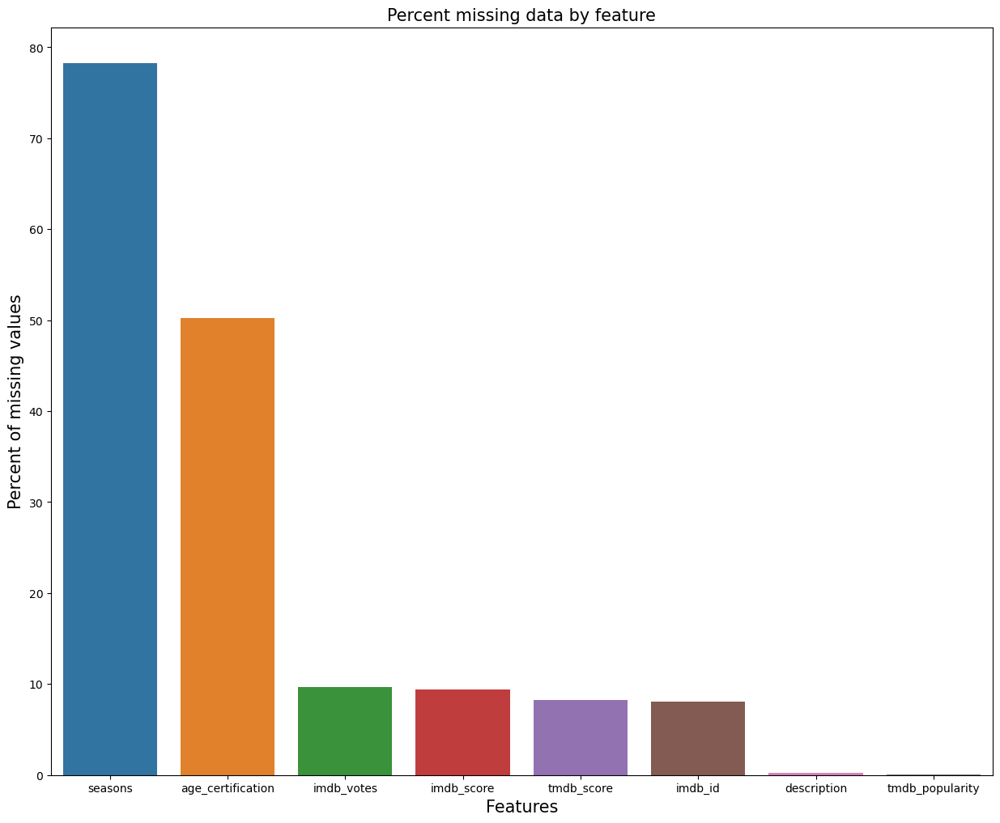

In [23]:
#Chck missing values
data_null = total_df_cp.isnull().sum()
data_null = data_null.drop(data_null[data_null == 0].index).sort_values(ascending=False)
data_missing = pd.DataFrame({'Missing Numbers' :data_null})
data_null =  data_null / len(total_df_cp)*100

# Barplot missing values
f, ax = plt.subplots(figsize=(15, 12))
#plt.xticks(rotation='90')
sns.barplot(x=data_null.index, y=data_null)
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)

print("Variables with Missing Qty : " , data_missing.count().values)
print("Total Missing values Qty : " , data_missing.sum().values)

#### Handling the 'genres' and 'production_countries' columns

In [24]:
# For genres
total_df_cp['genres'] = total_df_cp['genres'].str.replace(r'[','').str.replace(r"'",'').str.replace(r']','')

# For countries
total_df_cp['production_countries'] = total_df_cp['production_countries'].str.replace(r'[','').str.replace(r"'",'').str.replace(r']','')

C:\Users\li493\AppData\Local\Temp\ipykernel_20992\554744558.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  total_df_cp['genres'] = total_df_cp['genres'].str.replace(r'[','').str.replace(r"'",'').str.replace(r']','')
C:\Users\li493\AppData\Local\Temp\ipykernel_20992\554744558.py:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  total_df_cp['production_countries'] = total_df_cp['production_countries'].str.replace(r'[','').str.replace(r"'",'').str.replace(r']','')


#### Handling the 'seasons' col

In [25]:
len(total_df_cp.loc[(total_df_cp['seasons'].isna()) & (total_df_cp['type'] == 'MOVIE')]) == total_df_cp.seasons.isna().sum()

True

As we can see, all missing value in 'seasons' col are movies, thus we'll replace null in 0

In [26]:
# If season is null means it's movie, so we'll replace null to be 0
total_df_cp['seasons'].fillna(0, inplace=True)

Variables with Missing Qty :  [7]
Total Missing values Qty :  [18442]


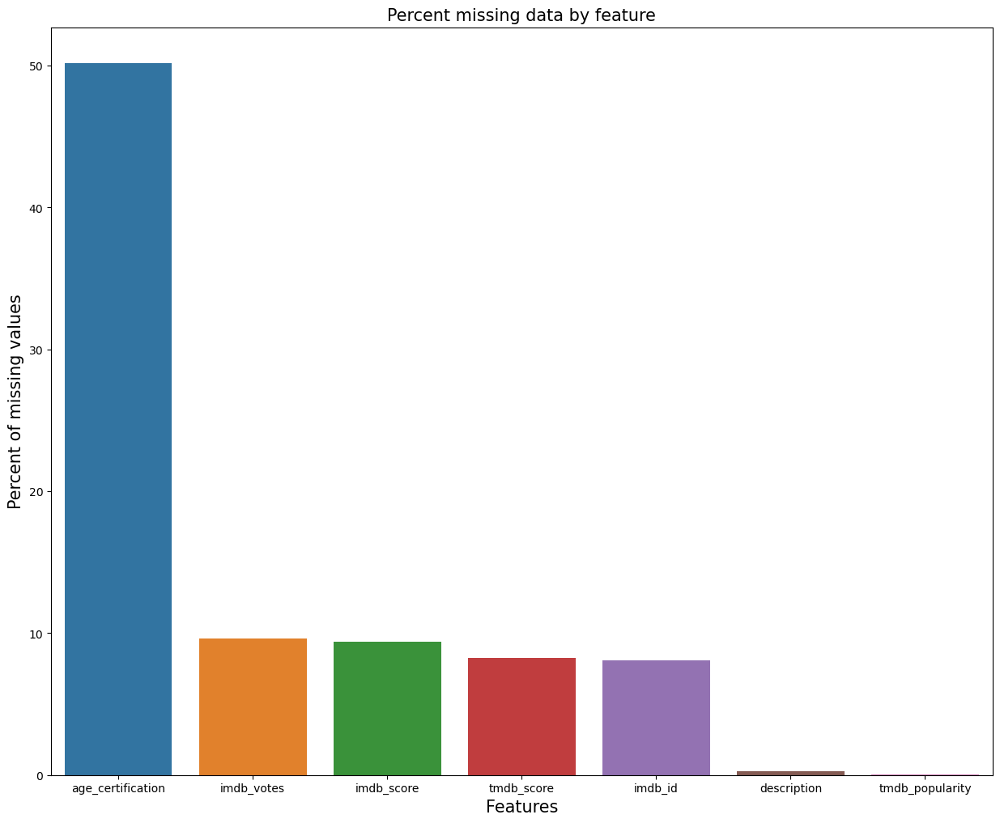

In [27]:
#Chck missing values
data_null = total_df_cp.isnull().sum()
data_null = data_null.drop(data_null[data_null == 0].index).sort_values(ascending=False)
data_missing = pd.DataFrame({'Missing Numbers' :data_null})
data_null =  data_null / len(total_df_cp)*100

# Barplot missing values
f, ax = plt.subplots(figsize=(15, 12))
#plt.xticks(rotation='90')
sns.barplot(x=data_null.index, y=data_null)
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)

print("Variables with Missing Qty : " , data_missing.count().values)
print("Total Missing values Qty : " , data_missing.sum().values)

#### add streaming_platform col - list that indicates where the movie/tv show is avialable

In [28]:
# we want to know for each movie/show in which streaming options it's avilable
lt = []
for i in total_df_cp['id']:
    movie_streaming = []
    if i in amazon_df['id'].values:
        movie_streaming.append('amazon')
    if i in apple_df['id'].values:
        movie_streaming.append('apple')
    if i in disney_df['id'].values:
        movie_streaming.append('disney')
    if i in HBO_df['id'].values:
        movie_streaming.append('HBO')
    if i in netflix_df['id'].values:
        movie_streaming.append('netflix')
    if i in paramount_df['id'].values:
        movie_streaming.append('paramount')
    lt.append(movie_streaming)

In [29]:
total_df_cp['streaming_platform'] = lt

In [30]:
total_df_cp

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,name,score_actors,score_directors,streaming_platform
0,tm82169,Rocky,MOVIE,"When world heavyweight boxing champion, Apollo...",1976,PG,119,"drama, sport",US,0.0,tt0075148,8.1,588100.0,106.361,7.782,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.250000,0.0,"[amazon, netflix, paramount]"
1,tm17823,Grease,MOVIE,Australian good girl Sandy and greaser Danny f...,1978,PG,110,"romance, comedy",US,0.0,tt0077631,7.2,283316.0,33.160,7.406,"John Travolta, Olivia Newton-John, Stockard Ch...",0.500000,0.0,"[netflix, paramount]"
2,tm191099,The Sting,MOVIE,A novice con man teams up with an acknowledged...,1973,PG,129,"crime, drama, comedy, music",US,0.0,tt0070735,8.3,266738.0,24.616,8.020,"Paul Newman, Robert Redford, Robert Shaw, Char...",1.083333,0.0,[netflix]
3,tm69975,Rocky II,MOVIE,After Rocky goes the distance with champ Apoll...,1979,PG,119,"drama, sport",US,0.0,tt0079817,7.3,216307.0,75.699,7.246,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.250000,0.0,"[amazon, netflix, paramount]"
4,tm127384,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",1975,PG,91,"fantasy, comedy",GB,0.0,tt0071853,8.2,547292.0,20.964,7.804,"Graham Chapman, John Cleese, Eric Idle, Terry ...",0.000000,0.0,[netflix]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21481,tm1305288,"Marcella Arguello: Bitch, Grow Up!",MOVIE,Arguello couples her larger-than-life stage pr...,2023,R,37,comedy,US,0.0,tt26623699,6.9,27.0,7.509,2.000,"Marcella Arguello, Aida Rodríguez",0.000000,0.0,[HBO]
21482,tm1303655,Super-Vilains: l'Enquête,MOVIE,Comic book writers discuss how they make the v...,2023,PG-13,62,documentation,FR,0.0,tt26498712,5.5,45.0,3.402,6.000,"Xavier Fournier, Frédéric Ralière",0.000000,0.0,[HBO]
21483,tm1296261,Just a Boy From Tupelo: Bringing Elvis to the ...,MOVIE,"Director Baz Luhrmann, actors Austin Butler an...",2023,PG-13,27,documentation,,0.0,NaN,NaN,NaN,2.605,4.500,"Elvis Presley, Austin Butler, Baz Luhrmann, To...",0.250000,0.0,[HBO]
21484,tm1065897,Dionne Warwick: Don't Make Me Over,MOVIE,The story of the iconic singer's fascinating s...,2023,PG,95,"documentation, music","US, GB",0.0,tt6170406,7.8,255.0,9.371,NaN,"Dionne Warwick, Quincy Jones, Burt Bacharach, ...",0.500000,0.0,[HBO]


Distribution of Release Years

In [31]:
fig = px.histogram(data_frame=total_df_cp, x='release_year', nbins=50, title='Distribution of Release Years')
fig.show()

### Handling genres col

In [32]:
# turn genres into list
total_df_cp['genres'] = total_df_cp['genres'].str.split(', ')

In [33]:
genre_count_df = total_df_cp.explode('genres').groupby('genres')['title'].count().sort_values(ascending=False).reset_index(name='count')
genre_count_df = pd.DataFrame(genre_count_df)
genre_count_df

,genres,count
0,drama,10383
1,comedy,7788
2,thriller,4434
3,action,4178
4,romance,3574
5,documentation,3422
6,crime,2957
7,family,2662
8,scifi,2027
9,fantasy,2025


In [34]:
# drop the empty row
genre_count_df.drop(19, axis=0, inplace=True)
genre_count_df

,genres,count
0,drama,10383
1,comedy,7788
2,thriller,4434
3,action,4178
4,romance,3574
5,documentation,3422
6,crime,2957
7,family,2662
8,scifi,2027
9,fantasy,2025


In [35]:
total_df_cp

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,name,score_actors,score_directors,streaming_platform
0,tm82169,Rocky,MOVIE,"When world heavyweight boxing champion, Apollo...",1976,PG,119,"[drama, sport]",US,0.0,tt0075148,8.1,588100.0,106.361,7.782,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.250000,0.0,"[amazon, netflix, paramount]"
1,tm17823,Grease,MOVIE,Australian good girl Sandy and greaser Danny f...,1978,PG,110,"[romance, comedy]",US,0.0,tt0077631,7.2,283316.0,33.160,7.406,"John Travolta, Olivia Newton-John, Stockard Ch...",0.500000,0.0,"[netflix, paramount]"
2,tm191099,The Sting,MOVIE,A novice con man teams up with an acknowledged...,1973,PG,129,"[crime, drama, comedy, music]",US,0.0,tt0070735,8.3,266738.0,24.616,8.020,"Paul Newman, Robert Redford, Robert Shaw, Char...",1.083333,0.0,[netflix]
3,tm69975,Rocky II,MOVIE,After Rocky goes the distance with champ Apoll...,1979,PG,119,"[drama, sport]",US,0.0,tt0079817,7.3,216307.0,75.699,7.246,"Sylvester Stallone, Talia Shire, Burt Young, C...",0.250000,0.0,"[amazon, netflix, paramount]"
4,tm127384,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",1975,PG,91,"[fantasy, comedy]",GB,0.0,tt0071853,8.2,547292.0,20.964,7.804,"Graham Chapman, John Cleese, Eric Idle, Terry ...",0.000000,0.0,[netflix]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21481,tm1305288,"Marcella Arguello: Bitch, Grow Up!",MOVIE,Arguello couples her larger-than-life stage pr...,2023,R,37,[comedy],US,0.0,tt26623699,6.9,27.0,7.509,2.000,"Marcella Arguello, Aida Rodríguez",0.000000,0.0,[HBO]
21482,tm1303655,Super-Vilains: l'Enquête,MOVIE,Comic book writers discuss how they make the v...,2023,PG-13,62,[documentation],FR,0.0,tt26498712,5.5,45.0,3.402,6.000,"Xavier Fournier, Frédéric Ralière",0.000000,0.0,[HBO]
21483,tm1296261,Just a Boy From Tupelo: Bringing Elvis to the ...,MOVIE,"Director Baz Luhrmann, actors Austin Butler an...",2023,PG-13,27,[documentation],,0.0,NaN,NaN,NaN,2.605,4.500,"Elvis Presley, Austin Butler, Baz Luhrmann, To...",0.250000,0.0,[HBO]
21484,tm1065897,Dionne Warwick: Don't Make Me Over,MOVIE,The story of the iconic singer's fascinating s...,2023,PG,95,"[documentation, music]","US, GB",0.0,tt6170406,7.8,255.0,9.371,NaN,"Dionne Warwick, Quincy Jones, Burt Bacharach, ...",0.500000,0.0,[HBO]


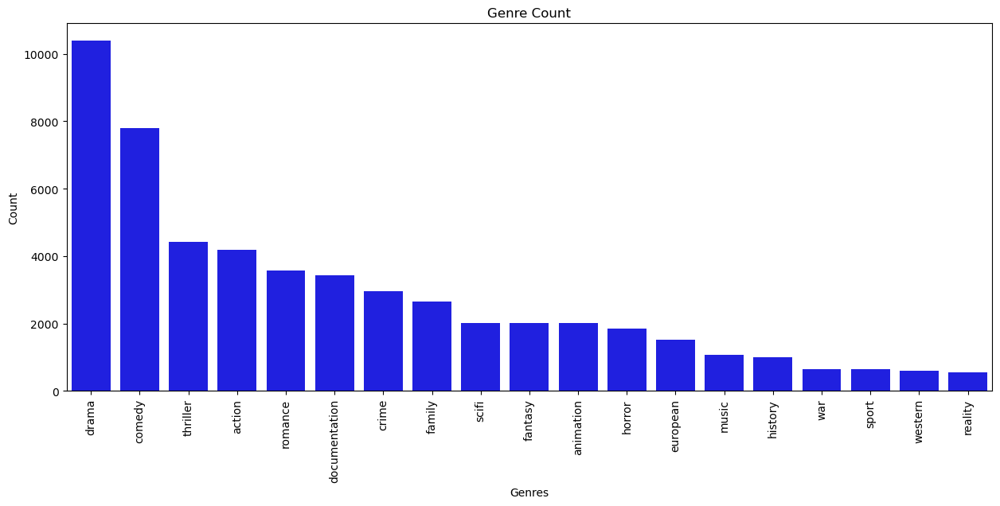

In [36]:
# total_df['genres'] = total_df['genres'].str.split(',')
# genre_count_df = total_df.explode('genres').groupby('genres')['title'].count().reset_index(name='count')
plt.figure(figsize=(15, 6))
sns.barplot(data=genre_count_df, x='genres', y='count', color='blue')
plt.title('Genre Count')
plt.xlabel('Genres')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [37]:
df = total_df_cp.explode('genres').groupby('genres')['imdb_score'].agg('mean').sort_values(ascending=False).reset_index()
df.head()

,genres,imdb_score
0,documentation,7.029281
1,history,7.013751
2,war,6.748899
3,animation,6.665857
4,sport,6.633648


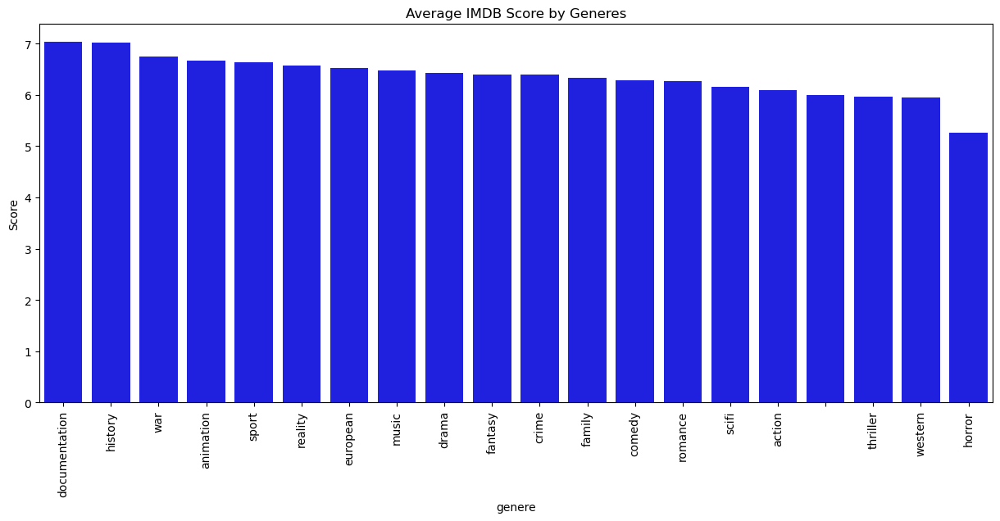

In [38]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='genres', y='imdb_score', color='blue')
plt.title('Average IMDB Score by Generes')
plt.xlabel('genere')
plt.ylabel('Score')
plt.xticks(rotation=90)
plt.show()

### movies vs. shows
Maybe later we will want to seperate them into 2 different datasets???

In [39]:
#Grouping the data based on 'type' column and counting the number of movies and shows. Storing the result in count_df. Creating a bar chart using plotly library based on count_df data.
count_df = total_df_cp.groupby('type')['imdb_id'].count().reset_index(name='count')

fig_bar = px.bar(count_df, x='type', y='count', title='Count of Movies vs. Shows')
fig_bar.show()

In [40]:
#Creating a histogram based on analysed_data with release year on x-axis and count on y-axis. Adding color based on 'type' column. Setting labels for better readability. 
fig_histogram = px.histogram(total_df_cp, x="release_year", nbins=10, color="type",
                   labels={"release_year": "Release Year", "count": "Count", "type": "Type"},
                   title="Distribution of Movies and Shows by Release Year")

fig_histogram.show()

In [41]:
total_df_cp['production_countries'] = total_df_cp['production_countries'].str.split(', ')

In [42]:
country_count_df = total_df_cp.explode('production_countries').groupby('production_countries')['title'].count().sort_values(ascending=False).reset_index(name='count')
country_count_df = pd.DataFrame(country_count_df)

In [43]:
country_count_df.drop(4, axis=0, inplace=True)


In [44]:
to_plot = country_count_df.iloc[:20]

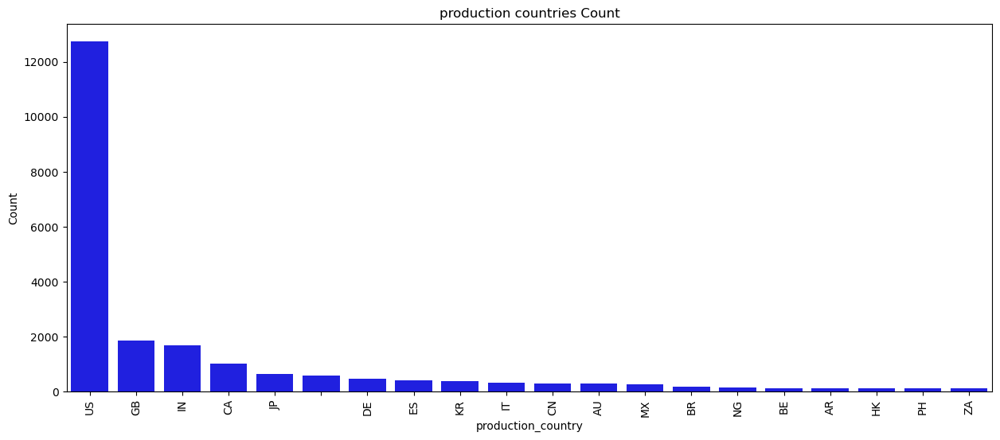

In [45]:
plt.figure(figsize=(15, 6))
sns.barplot(data=to_plot, x='production_countries', y='count', color='blue')
plt.title('production countries Count')
plt.xlabel('production_country')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

#### drop irelevant features

In [46]:
# drop id fields because they are not neccassary
total_df_cp.drop(['id', 'imdb_id'], axis=1, inplace=True)

In [47]:
type_df = total_df_cp.groupby('type')['title'].count().sort_values(ascending=False).reset_index(name='count')
type_count_df = pd.DataFrame(type_df)
type_count_df

,type,count
0,MOVIE,16823
1,SHOW,4663


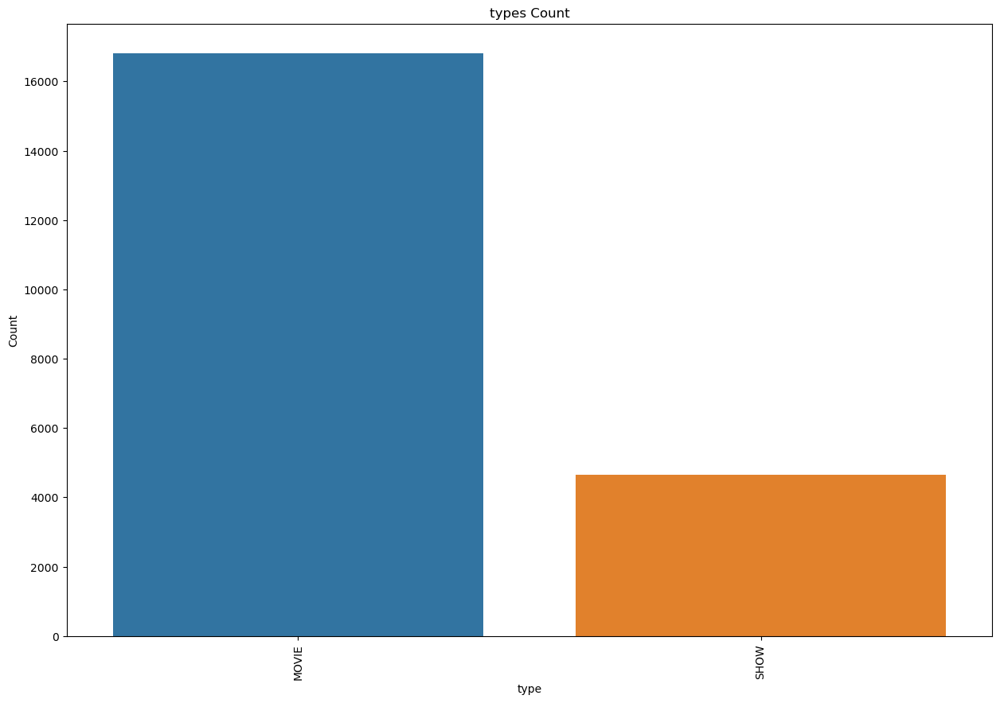

In [48]:
plt.figure(figsize=(15, 10))
sns.barplot(x=type_count_df['type'], y=type_count_df['count'])
plt.title('types Count')
plt.xlabel('type')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

### Age certification

In [49]:
age_count_df = total_df_cp.groupby('age_certification')['title'].count().sort_values(ascending=False).reset_index(name='count')
age_count_df = pd.DataFrame(age_count_df)

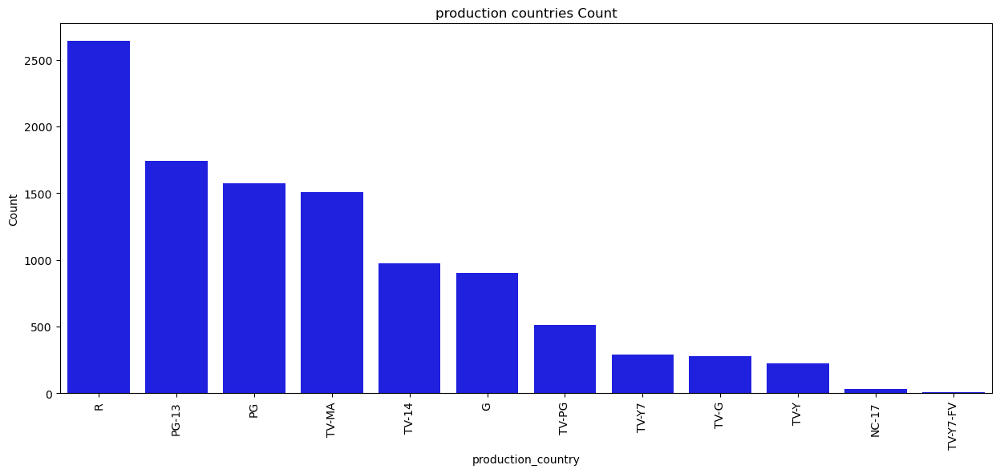

In [50]:
plt.figure(figsize=(15, 6))
sns.barplot(data=age_count_df, x='age_certification', y='count', color='blue')
plt.title('production countries Count')
plt.xlabel('production_country')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [51]:
age_score = total_df_cp.groupby('age_certification')['imdb_score'].agg('mean').sort_values(ascending=False).reset_index()
age_score.head()

,age_certification,imdb_score
0,TV-Y7-FV,7.230000
1,TV-MA,7.181743
2,TV-PG,7.154845
3,TV-14,7.096348
4,TV-Y7,6.744366


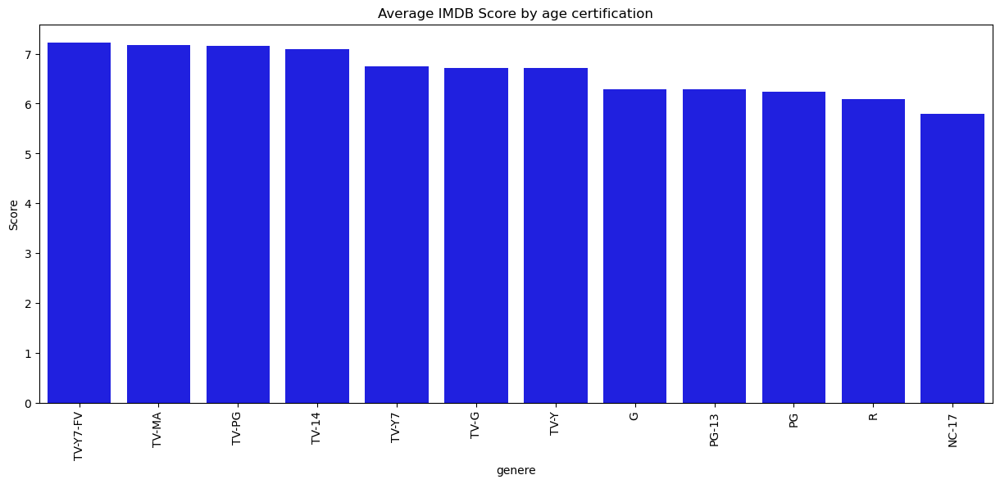

In [52]:
plt.figure(figsize=(15, 6))
sns.barplot(data=age_score, x='age_certification', y='imdb_score', color='blue')
plt.title('Average IMDB Score by age certification')
plt.xlabel('genere')
plt.ylabel('Score')
plt.xticks(rotation=90)
plt.show()

In [53]:
total_df_cp['age_certification'].isnull().sum()

10786

In [54]:
total_df_cp['age_certification'] = total_df_cp['age_certification'].fillna('other')

### Label investigation

<AxesSubplot:>

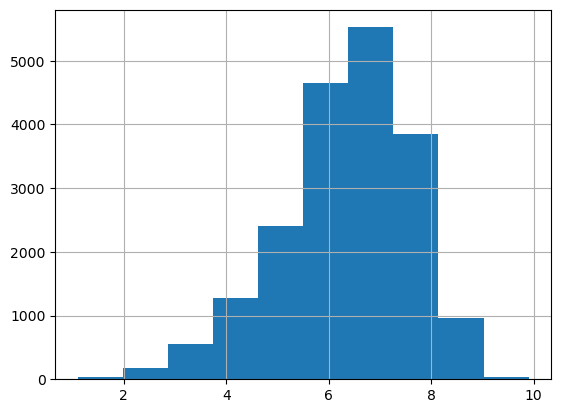

In [55]:
# Label
total_df_cp['imdb_score'].hist()

C:\Users\li493\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='imdb_score', ylabel='Density'>

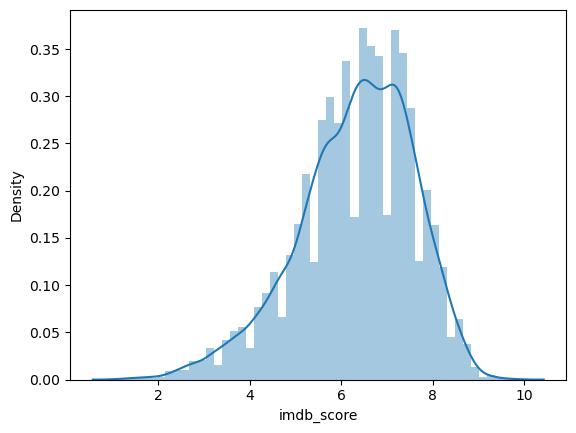

In [56]:
sns.distplot(total_df_cp['imdb_score'])

The distribution seems ok, no need to normalize or anything

In [57]:
numerical_features = total_df_cp.select_dtypes(exclude=['object'])
categorical_features = total_df_cp.select_dtypes(include=['object'])

In [58]:
numerical_features.shape

(21486, 9)

In [59]:
numerical_features.isnull().sum().sort_values(ascending = False)

imdb_votes         2071
imdb_score         2020
tmdb_score         1767
tmdb_popularity      11
release_year          0
runtime               0
seasons               0
score_actors          0
score_directors       0
dtype: int64

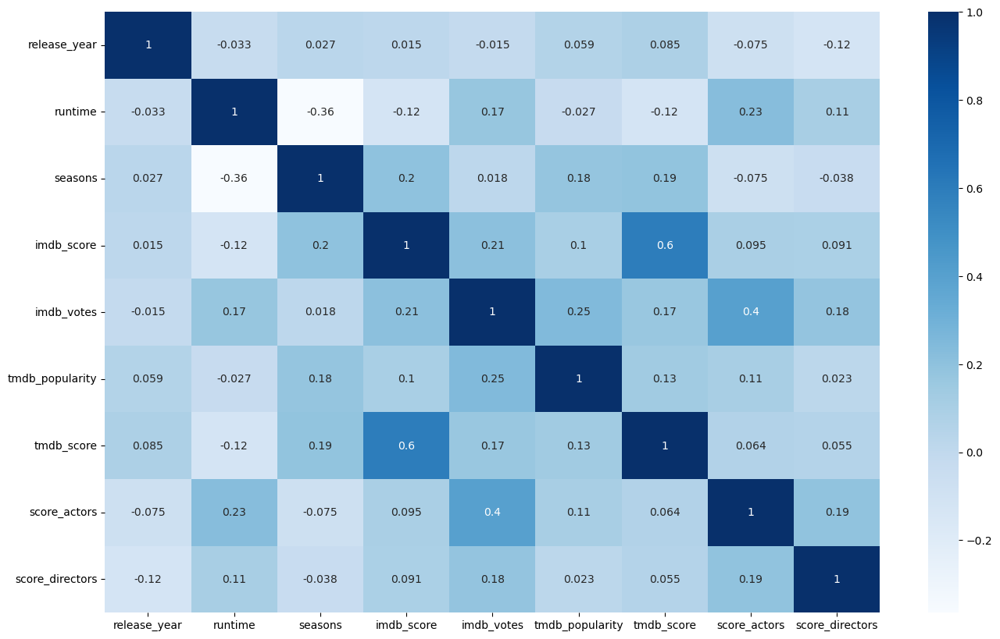

In [60]:
# create correlation heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(numerical_features.corr(), annot=True, cmap='Blues')
plt.show()

In [61]:
movies_df = total_df_cp[total_df_cp['type'] == "MOVIE"]
shows_df = total_df_cp[total_df_cp['type'] == "SHOW"]

Variables with Missing Qty :  [5]
Total Missing values Qty :  [5925]


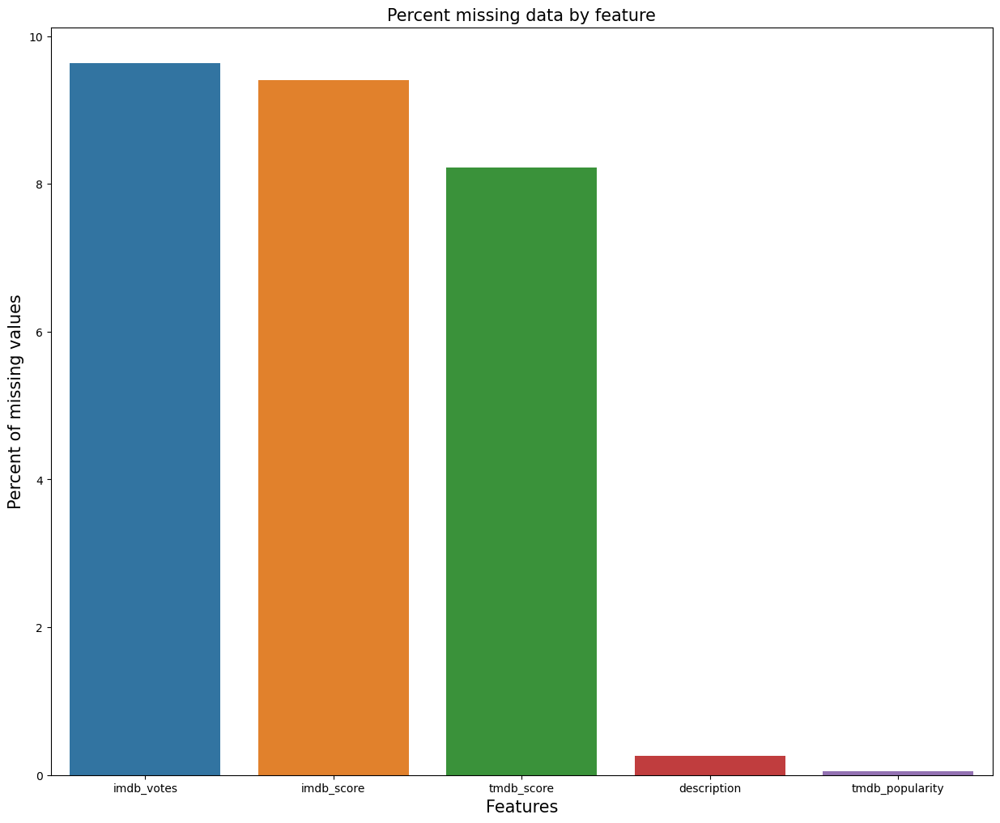

In [62]:
#Chck missing values
data_null = total_df_cp.isnull().sum()
data_null = data_null.drop(data_null[data_null == 0].index).sort_values(ascending=False)
data_missing = pd.DataFrame({'Missing Numbers' :data_null})
data_null =  data_null / len(total_df_cp)*100

# Barplot missing values
f, ax = plt.subplots(figsize=(15, 12))
#plt.xticks(rotation='90')
sns.barplot(x=data_null.index, y=data_null)
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)

print("Variables with Missing Qty : " , data_missing.count().values)
print("Total Missing values Qty : " , data_missing.sum().values)

### One hot encoding

#### Age cert col

In [63]:
encoded = pd.get_dummies(total_df_cp.age_certification.apply(pd.Series).stack(),  prefix = 'age_certification', drop_first=True).sum(level=0)
encoded

C:\Users\li493\AppData\Local\Temp\ipykernel_20992\3629250324.py:1: FutureWarning:

Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().



,age_certification_NC-17,age_certification_PG,age_certification_PG-13,age_certification_R,age_certification_TV-14,age_certification_TV-G,age_certification_TV-MA,age_certification_TV-PG,age_certification_TV-Y,age_certification_TV-Y7,age_certification_TV-Y7-FV,age_certification_other
0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
21481,0,0,0,1,0,0,0,0,0,0,0,0
21482,0,0,1,0,0,0,0,0,0,0,0,0
21483,0,0,1,0,0,0,0,0,0,0,0,0
21484,0,1,0,0,0,0,0,0,0,0,0,0


In [64]:
total_df_cp = pd.concat([total_df_cp, encoded], axis=1)
total_df_cp.drop('age_certification', axis=1, inplace=True)
total_df_cp

,title,type,description,release_year,runtime,genres,production_countries,seasons,imdb_score,imdb_votes,...,age_certification_PG-13,age_certification_R,age_certification_TV-14,age_certification_TV-G,age_certification_TV-MA,age_certification_TV-PG,age_certification_TV-Y,age_certification_TV-Y7,age_certification_TV-Y7-FV,age_certification_other
0,Rocky,MOVIE,"When world heavyweight boxing champion, Apollo...",1976,119,"[drama, sport]",[US],0.0,8.1,588100.0,...,0,0,0,0,0,0,0,0,0,0
1,Grease,MOVIE,Australian good girl Sandy and greaser Danny f...,1978,110,"[romance, comedy]",[US],0.0,7.2,283316.0,...,0,0,0,0,0,0,0,0,0,0
2,The Sting,MOVIE,A novice con man teams up with an acknowledged...,1973,129,"[crime, drama, comedy, music]",[US],0.0,8.3,266738.0,...,0,0,0,0,0,0,0,0,0,0
3,Rocky II,MOVIE,After Rocky goes the distance with champ Apoll...,1979,119,"[drama, sport]",[US],0.0,7.3,216307.0,...,0,0,0,0,0,0,0,0,0,0
4,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",1975,91,"[fantasy, comedy]",[GB],0.0,8.2,547292.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21481,"Marcella Arguello: Bitch, Grow Up!",MOVIE,Arguello couples her larger-than-life stage pr...,2023,37,[comedy],[US],0.0,6.9,27.0,...,0,1,0,0,0,0,0,0,0,0
21482,Super-Vilains: l'Enquête,MOVIE,Comic book writers discuss how they make the v...,2023,62,[documentation],[FR],0.0,5.5,45.0,...,1,0,0,0,0,0,0,0,0,0
21483,Just a Boy From Tupelo: Bringing Elvis to the ...,MOVIE,"Director Baz Luhrmann, actors Austin Butler an...",2023,27,[documentation],[],0.0,NaN,NaN,...,1,0,0,0,0,0,0,0,0,0
21484,Dionne Warwick: Don't Make Me Over,MOVIE,The story of the iconic singer's fascinating s...,2023,95,"[documentation, music]","[US, GB]",0.0,7.8,255.0,...,0,0,0,0,0,0,0,0,0,0


#### Genres col

In [65]:
encoded = pd.get_dummies(total_df_cp.genres.apply(pd.Series).stack(),  prefix = 'Genre', drop_first=True).sum(level=0)
encoded

C:\Users\li493\AppData\Local\Temp\ipykernel_20992\3224430694.py:1: FutureWarning:

Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().



,Genre_action,Genre_animation,Genre_comedy,Genre_crime,Genre_documentation,Genre_drama,Genre_european,Genre_family,Genre_fantasy,Genre_history,Genre_horror,Genre_music,Genre_reality,Genre_romance,Genre_scifi,Genre_sport,Genre_thriller,Genre_war,Genre_western
0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21481,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21482,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21483,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21484,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [66]:
total_df_cp = pd.concat([total_df_cp, encoded], axis=1)
total_df_cp.drop('genres', axis=1, inplace=True)
total_df_cp

,title,type,description,release_year,runtime,production_countries,seasons,imdb_score,imdb_votes,tmdb_popularity,...,Genre_history,Genre_horror,Genre_music,Genre_reality,Genre_romance,Genre_scifi,Genre_sport,Genre_thriller,Genre_war,Genre_western
0,Rocky,MOVIE,"When world heavyweight boxing champion, Apollo...",1976,119,[US],0.0,8.1,588100.0,106.361,...,0,0,0,0,0,0,1,0,0,0
1,Grease,MOVIE,Australian good girl Sandy and greaser Danny f...,1978,110,[US],0.0,7.2,283316.0,33.160,...,0,0,0,0,1,0,0,0,0,0
2,The Sting,MOVIE,A novice con man teams up with an acknowledged...,1973,129,[US],0.0,8.3,266738.0,24.616,...,0,0,1,0,0,0,0,0,0,0
3,Rocky II,MOVIE,After Rocky goes the distance with champ Apoll...,1979,119,[US],0.0,7.3,216307.0,75.699,...,0,0,0,0,0,0,1,0,0,0
4,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",1975,91,[GB],0.0,8.2,547292.0,20.964,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21481,"Marcella Arguello: Bitch, Grow Up!",MOVIE,Arguello couples her larger-than-life stage pr...,2023,37,[US],0.0,6.9,27.0,7.509,...,0,0,0,0,0,0,0,0,0,0
21482,Super-Vilains: l'Enquête,MOVIE,Comic book writers discuss how they make the v...,2023,62,[FR],0.0,5.5,45.0,3.402,...,0,0,0,0,0,0,0,0,0,0
21483,Just a Boy From Tupelo: Bringing Elvis to the ...,MOVIE,"Director Baz Luhrmann, actors Austin Butler an...",2023,27,[],0.0,NaN,NaN,2.605,...,0,0,0,0,0,0,0,0,0,0
21484,Dionne Warwick: Don't Make Me Over,MOVIE,The story of the iconic singer's fascinating s...,2023,95,"[US, GB]",0.0,7.8,255.0,9.371,...,0,0,1,0,0,0,0,0,0,0


#### Type col

In [67]:
encoded = pd.get_dummies(total_df_cp.type.apply(pd.Series).stack(),  prefix = 'Type', drop_first=True).sum(level=0)
encoded

C:\Users\li493\AppData\Local\Temp\ipykernel_20992\4156170511.py:1: FutureWarning:

Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().



,Type_SHOW
0,0
1,0
2,0
3,0
4,0
...,...
21481,0
21482,0
21483,0
21484,0


In [68]:
total_df_cp = pd.concat([total_df_cp, encoded], axis=1)
total_df_cp.drop('type', axis=1, inplace=True)
total_df_cp

,title,description,release_year,runtime,production_countries,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,...,Genre_horror,Genre_music,Genre_reality,Genre_romance,Genre_scifi,Genre_sport,Genre_thriller,Genre_war,Genre_western,Type_SHOW
0,Rocky,"When world heavyweight boxing champion, Apollo...",1976,119,[US],0.0,8.1,588100.0,106.361,7.782,...,0,0,0,0,0,1,0,0,0,0
1,Grease,Australian good girl Sandy and greaser Danny f...,1978,110,[US],0.0,7.2,283316.0,33.160,7.406,...,0,0,0,1,0,0,0,0,0,0
2,The Sting,A novice con man teams up with an acknowledged...,1973,129,[US],0.0,8.3,266738.0,24.616,8.020,...,0,1,0,0,0,0,0,0,0,0
3,Rocky II,After Rocky goes the distance with champ Apoll...,1979,119,[US],0.0,7.3,216307.0,75.699,7.246,...,0,0,0,0,0,1,0,0,0,0
4,Monty Python and the Holy Grail,"King Arthur, accompanied by his squire, recrui...",1975,91,[GB],0.0,8.2,547292.0,20.964,7.804,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21481,"Marcella Arguello: Bitch, Grow Up!",Arguello couples her larger-than-life stage pr...,2023,37,[US],0.0,6.9,27.0,7.509,2.000,...,0,0,0,0,0,0,0,0,0,0
21482,Super-Vilains: l'Enquête,Comic book writers discuss how they make the v...,2023,62,[FR],0.0,5.5,45.0,3.402,6.000,...,0,0,0,0,0,0,0,0,0,0
21483,Just a Boy From Tupelo: Bringing Elvis to the ...,"Director Baz Luhrmann, actors Austin Butler an...",2023,27,[],0.0,NaN,NaN,2.605,4.500,...,0,0,0,0,0,0,0,0,0,0
21484,Dionne Warwick: Don't Make Me Over,The story of the iconic singer's fascinating s...,2023,95,"[US, GB]",0.0,7.8,255.0,9.371,NaN,...,0,1,0,0,0,0,0,0,0,0


#### Production_contries col

In [69]:
encoded = pd.get_dummies(total_df_cp.production_countries.apply(pd.Series).stack(),  prefix = 'Country', drop_first=True).sum(level=0)
encoded

C:\Users\li493\AppData\Local\Temp\ipykernel_20992\859158459.py:1: FutureWarning:

Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().



,Country_AE,Country_AF,Country_AL,Country_AN,Country_AO,Country_AQ,Country_AR,Country_AT,Country_AU,Country_AZ,...,Country_UZ,Country_VA,Country_VE,Country_VN,Country_VU,Country_XC,Country_XK,Country_YU,Country_ZA,Country_ZW
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21481,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21482,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21483,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21484,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [70]:
total_df_cp = pd.concat([total_df_cp, encoded], axis=1)
total_df_cp.drop('production_countries', axis=1, inplace=True)
total_df_cp

,title,description,release_year,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,name,...,Country_UZ,Country_VA,Country_VE,Country_VN,Country_VU,Country_XC,Country_XK,Country_YU,Country_ZA,Country_ZW
0,Rocky,"When world heavyweight boxing champion, Apollo...",1976,119,0.0,8.1,588100.0,106.361,7.782,"Sylvester Stallone, Talia Shire, Burt Young, C...",...,0,0,0,0,0,0,0,0,0,0
1,Grease,Australian good girl Sandy and greaser Danny f...,1978,110,0.0,7.2,283316.0,33.160,7.406,"John Travolta, Olivia Newton-John, Stockard Ch...",...,0,0,0,0,0,0,0,0,0,0
2,The Sting,A novice con man teams up with an acknowledged...,1973,129,0.0,8.3,266738.0,24.616,8.020,"Paul Newman, Robert Redford, Robert Shaw, Char...",...,0,0,0,0,0,0,0,0,0,0
3,Rocky II,After Rocky goes the distance with champ Apoll...,1979,119,0.0,7.3,216307.0,75.699,7.246,"Sylvester Stallone, Talia Shire, Burt Young, C...",...,0,0,0,0,0,0,0,0,0,0
4,Monty Python and the Holy Grail,"King Arthur, accompanied by his squire, recrui...",1975,91,0.0,8.2,547292.0,20.964,7.804,"Graham Chapman, John Cleese, Eric Idle, Terry ...",...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21481,"Marcella Arguello: Bitch, Grow Up!",Arguello couples her larger-than-life stage pr...,2023,37,0.0,6.9,27.0,7.509,2.000,"Marcella Arguello, Aida Rodríguez",...,0,0,0,0,0,0,0,0,0,0
21482,Super-Vilains: l'Enquête,Comic book writers discuss how they make the v...,2023,62,0.0,5.5,45.0,3.402,6.000,"Xavier Fournier, Frédéric Ralière",...,0,0,0,0,0,0,0,0,0,0
21483,Just a Boy From Tupelo: Bringing Elvis to the ...,"Director Baz Luhrmann, actors Austin Butler an...",2023,27,0.0,NaN,NaN,2.605,4.500,"Elvis Presley, Austin Butler, Baz Luhrmann, To...",...,0,0,0,0,0,0,0,0,0,0
21484,Dionne Warwick: Don't Make Me Over,The story of the iconic singer's fascinating s...,2023,95,0.0,7.8,255.0,9.371,NaN,"Dionne Warwick, Quincy Jones, Burt Bacharach, ...",...,0,0,0,0,0,0,0,0,0,0


#### streaming options  col

In [71]:
encoded = pd.get_dummies(total_df_cp.streaming_platform.apply(pd.Series).stack(),  prefix = 'streaming_platform').sum(level=0)
encoded

C:\Users\li493\AppData\Local\Temp\ipykernel_20992\2691480625.py:1: FutureWarning:

Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().



,streaming_platform_HBO,streaming_platform_amazon,streaming_platform_apple,streaming_platform_disney,streaming_platform_netflix,streaming_platform_paramount
0,0,1,0,0,1,1
1,0,0,0,0,1,1
2,0,0,0,0,1,0
3,0,1,0,0,1,1
4,0,0,0,0,1,0
...,...,...,...,...,...,...
21481,1,0,0,0,0,0
21482,1,0,0,0,0,0
21483,1,0,0,0,0,0
21484,1,0,0,0,0,0


In [72]:
total_df_cp = pd.concat([total_df_cp, encoded], axis=1)
total_df_cp.drop('streaming_platform', axis=1, inplace=True)
total_df_cp

,title,description,release_year,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,name,...,Country_XK,Country_YU,Country_ZA,Country_ZW,streaming_platform_HBO,streaming_platform_amazon,streaming_platform_apple,streaming_platform_disney,streaming_platform_netflix,streaming_platform_paramount
0,Rocky,"When world heavyweight boxing champion, Apollo...",1976,119,0.0,8.1,588100.0,106.361,7.782,"Sylvester Stallone, Talia Shire, Burt Young, C...",...,0,0,0,0,0,1,0,0,1,1
1,Grease,Australian good girl Sandy and greaser Danny f...,1978,110,0.0,7.2,283316.0,33.160,7.406,"John Travolta, Olivia Newton-John, Stockard Ch...",...,0,0,0,0,0,0,0,0,1,1
2,The Sting,A novice con man teams up with an acknowledged...,1973,129,0.0,8.3,266738.0,24.616,8.020,"Paul Newman, Robert Redford, Robert Shaw, Char...",...,0,0,0,0,0,0,0,0,1,0
3,Rocky II,After Rocky goes the distance with champ Apoll...,1979,119,0.0,7.3,216307.0,75.699,7.246,"Sylvester Stallone, Talia Shire, Burt Young, C...",...,0,0,0,0,0,1,0,0,1,1
4,Monty Python and the Holy Grail,"King Arthur, accompanied by his squire, recrui...",1975,91,0.0,8.2,547292.0,20.964,7.804,"Graham Chapman, John Cleese, Eric Idle, Terry ...",...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21481,"Marcella Arguello: Bitch, Grow Up!",Arguello couples her larger-than-life stage pr...,2023,37,0.0,6.9,27.0,7.509,2.000,"Marcella Arguello, Aida Rodríguez",...,0,0,0,0,1,0,0,0,0,0
21482,Super-Vilains: l'Enquête,Comic book writers discuss how they make the v...,2023,62,0.0,5.5,45.0,3.402,6.000,"Xavier Fournier, Frédéric Ralière",...,0,0,0,0,1,0,0,0,0,0
21483,Just a Boy From Tupelo: Bringing Elvis to the ...,"Director Baz Luhrmann, actors Austin Butler an...",2023,27,0.0,NaN,NaN,2.605,4.500,"Elvis Presley, Austin Butler, Baz Luhrmann, To...",...,0,0,0,0,1,0,0,0,0,0
21484,Dionne Warwick: Don't Make Me Over,The story of the iconic singer's fascinating s...,2023,95,0.0,7.8,255.0,9.371,NaN,"Dionne Warwick, Quincy Jones, Burt Bacharach, ...",...,0,0,0,0,1,0,0,0,0,0


### Drop features
We drop those featires because they're not fair to include in the model

In [73]:
# total_df_cp.drop(['Country_AQ', 'Country_VU', 'Country_PF','imdb_votes'], axis=1, inplace=True)
total_df_cp.drop(['imdb_votes', 'tmdb_score', 'tmdb_popularity'], axis=1, inplace=True)

### Add sentiment col based on description

We took list of positive and negative words:
https://ptrckprry.com/course/ssd/data/positive-words.txt

https://ptrckprry.com/course/ssd/data/positive-words.txt

In [74]:
# Insert all positive words into list
positive_words_file = open("positive-words.txt", "r")
positive_words = positive_words_file.read()
positive_words = positive_words.split('\n')
positive_words_file.close()

In [75]:
# Insert all negative words into list
negative_words_file = open("negative-words.txt", "r")
negative_words = negative_words_file.read()
negative_words = negative_words.split('\n')
negative_words_file.close()

In [76]:
# replace null to be an empty string
total_df_cp['description'] = total_df_cp['description'].replace(np.nan, '')

In [77]:
total_df_cp.isna().sum()

title                           0
description                     0
release_year                    0
runtime                         0
seasons                         0
                               ..
streaming_platform_amazon       0
streaming_platform_apple        0
streaming_platform_disney       0
streaming_platform_netflix      0
streaming_platform_paramount    0
Length: 198, dtype: int64

In [78]:
description_df = total_df_cp['description']
description_df = pd.DataFrame(description_df)
description_df

,description
0,"When world heavyweight boxing champion, Apollo..."
1,Australian good girl Sandy and greaser Danny f...
2,A novice con man teams up with an acknowledged...
3,After Rocky goes the distance with champ Apoll...
4,"King Arthur, accompanied by his squire, recrui..."
...,...
21481,Arguello couples her larger-than-life stage pr...
21482,Comic book writers discuss how they make the v...
21483,"Director Baz Luhrmann, actors Austin Butler an..."
21484,The story of the iconic singer's fascinating s...


In [79]:
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize
def calc_sentiment(desc):
    print(desc)
    lemmatization = WordNetLemmatizer() 
    row_tokenized = word_tokenize(desc)
    count = 0
    for word in row_tokenized:
        word = word.lower()
        word = lemmatization.lemmatize(word)
        # If the word in positive words list - +1
        # If the word in negative words list - -1
        count += 1 if word in positive_words else -1 if word in negative_words else 0
    print(count)
    return 1 if count >= 0 else 0

In [80]:
total_df_cp['description'] = total_df_cp['description'].astype('str')

In [81]:
total_df_cp['sentiment'] = total_df_cp.apply(lambda row: calc_sentiment(row.description), axis=1)

When world heavyweight boxing champion, Apollo Creed wants to give an unknown fighter a shot at the title as a publicity stunt, his handlers choose palooka Rocky Balboa, an uneducated collector for a Philadelphia loan shark. Rocky teams up with trainer  Mickey Goldmill to make the most of this once in a lifetime break.
-5
Australian good girl Sandy and greaser Danny fell in love over the summer. But when they unexpectedly discover they're now in the same high school, will they be able to rekindle their romance despite their eccentric friends?
-1
A novice con man teams up with an acknowledged master to avenge the murder of a mutual friend by pulling off the ultimate big con and swindling a fortune from a big-time mobster.
-1
After Rocky goes the distance with champ Apollo Creed, both try to put the fight behind them and move on. Rocky settles down with Adrian but can't put his life together outside the ring, while Creed seeks a rematch to restore his reputation. Soon enough, the "Master

In [82]:
# total_df_cp.dropna(subset=['description','imdb_score'], inplace=True)

### Remove the textual features

In [83]:
# put the title and description cols on the side for later use
title_description_cols = total_df_cp['title']

In [84]:
title_description_cols = pd.concat([title_description_cols, total_df_cp['description']], axis=1)

In [85]:
total_df_cp.drop(['title', 'description'], axis=1, inplace=True)

### Split into movie df and shows df

In [86]:
# movies_df = total_df_cp[total_df_cp['Type_SHOW'] == 0]
# shows_df = total_df_cp[total_df_cp['Type_SHOW'] == 1]

In [87]:
# movies_df.drop(['Type_SHOW', 'seasons'], axis=1, inplace=True)
# shows_df.drop(['Type_SHOW'], axis=1, inplace=True)

### Imputation

All

In [88]:
total_df_cp.drop('name', axis=1, inplace=True)

In [89]:
from sklearn.impute import KNNImputer

# use KNN to impute missing values
imputer = KNNImputer(n_neighbors=5, weights="distance")
imputed = imputer.fit_transform(total_df_cp)

# replace values in the dataset with new imputed values
total_df_cp[total_df_cp.columns] = imputed

### TF-IDF vectors

We process the words in the documents by doing:
* Filter words to be from the english vovabulary
* Lemmatization
* Lower casing

#### * It didn't improve the result, thus it's commented

In [94]:
# # insert back the title and description columns
# total_df_cp = pd.concat([total_df_cp, title_description_cols], axis=1)

In [95]:
# english_vocab = sorted(set(w.lower() for w in nltk.corpus.words.words()))
# dictOfWords = { i : 0 for i in english_vocab }

In [96]:
# # we do lemmatization to the words in the files
# lemmatizer = WordNetLemmatizer()

# # Pre-process function to process the words
# def process(row):
#     description = str(row['description'])
#     title = str(row['title'])
    
#     word_list = word_tokenize(description)
#     word_list_title =  word_tokenize(title)
    
#     lemmatized_doc = ""
    
#     #description
#     for word in word_list:
#         # Keep only words appearing in the English vocabulary
#         if word.lower() in dictOfWords:
#             # Lemmatize the words
#             lemmatized_doc = lemmatized_doc + " " + lemmatizer.lemmatize(word.lower())
    
#     #title
#     for word in word_list_title:
#         # Keep only words appearing in the English vocabulary
#         if word.lower() in dictOfWords:
#             # Lemmatize the words
#             lemmatized_doc = lemmatized_doc + " " + lemmatizer.lemmatize(word.lower())
    
#     return lemmatized_doc

In [97]:
# total_df_cp['description'] = total_df_cp.apply(process, axis=1)

We used TfidfVectorizer class to create the idf vectors.<br>
It converts a collection of raw documents to a matrix of TF-IDF features.<br>
Parameters we used for definitation:
* <b>stop_words='english':</b> removes english stop words.
* <b>min_df=1:</b> ignore terms that have a document frequency less than 1.
* <b>norm=None:</b> No normalization applied on the vectors.
* <b>sublinear_tf=True:</b> Apply sublinear tf scaling, i.e. replace tf with 1 + log(tf).
* <b>smooth_idf=False:</b> determines whether to smooth idf weights by adding one to document frequencies (no need to smooth idf because we defined min df as 1)

Formula for computing TF-IDF is: <br><br>
<b>
<math>
  <mtext>tf-idf(t,d)</mtext>
  <mo>=</mo>
  <mtext>tf(t,d)</mtext>
  <mo>&#xD7;</mo>
  <mtext>idf(t)</mtext>
</math>
</b><br>

Where:

$$idf(t) = log \frac{ N}{ df(t) }$$
 
N - the total number of documents

And:
$$tf(t) = log(tf(t)) + 1$$

In [98]:
# # train vector
# tfidf_vect = TfidfVectorizer(stop_words='english', min_df=10, norm=None, sublinear_tf=True, smooth_idf=False)
# X_train_tfidf = tfidf_vect.fit_transform(total_df_cp['description'])
# X_train_tfidf.shape

In [99]:
# df_tfidf = pd.DataFrame(X_train_tfidf.toarray(), columns=tfidf_vect.get_feature_names_out())

In [100]:
# pd.DataFrame(X_train_tfidf.toarray(), columns=tfidf_vect.get_feature_names_out()).sample(10, axis=1).sample(10)

In [101]:
# total_df_cp = total_df_cp.reset_index(drop=True)

In [102]:
# total_df_cp = pd.concat([total_df_cp, df_tfidf], axis=1)

In [103]:
# del df_tfidf

In [104]:
# from sklearn.model_selection import train_test_split 
# X_movies = movies_df.drop('imdb_score', axis=1)
# y_movies = movies_df['imdb_score']
# X_train_movies,X_test_movies,y_train_movies,y_test_movies = train_test_split(X_movies ,y_movies, random_state = 42,test_size = 0.2)

# X_shows = shows_df.drop('imdb_score', axis=1)
# y_shows = shows_df['imdb_score']
# X_train_shows,X_test_shows,y_train_shows,y_test_shows = train_test_split(X_shows ,y_shows, random_state = 42,test_size = 0.2)

# X = total_df_cp.drop('imdb_score', axis=1)
# y = total_df_cp['imdb_score']

In [105]:
# for data in total_df_cp['imdb_score']:
#     q1 = total_df_cp['imdb_score'].quantile(0.25)
#     q3 = total_df_cp['imdb_score'].quantile(0.75)
#     iqr = q3 - q1
#     lower_tail = q1 - 1.5 * iqr
#     upper_tail = q3 + 1.5 * iqr
#     if data > upper_tail or data < lower_tail:
#         total_df_cp['imdb_score'] = total_df_cp['imdb_score'].replace(data, np.median(total_df_cp['imdb_score']))

### Data split & Label transformation

In [106]:
total_df_cp.shape

(21486, 196)

#### Change label from numeric to category using bins

In [107]:
total_df_cp["imdb_binned_score"]=pd.cut(total_df_cp['imdb_score'], bins=[0,4,6,8,10], right=True, labels=False)

C:\Users\li493\AppData\Local\Temp\ipykernel_20992\3635720060.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [108]:
total_df_cp.drop('imdb_score',axis=1,inplace=True)

In [109]:
X = total_df_cp.drop('imdb_binned_score', axis=1)
y = total_df_cp['imdb_binned_score']

### Outliers

In [110]:
#total_df_cp = pd.concat([X_resampled, y_resampled], axis=1)

In [111]:
# Identify binary columns (floats with values 0 and 1)
binary_columns = total_df_cp.columns[(total_df_cp.eq(0) | total_df_cp.eq(1)).all()]

# Convert binary columns to the binary data type
total_df_cp[binary_columns] = total_df_cp[binary_columns].astype('bool')


In [112]:
numerical_features = total_df_cp.select_dtypes(exclude=['bool'])
categorical_features = total_df_cp.select_dtypes(include=['bool'])

In [113]:
df_cat = total_df_cp.drop(categorical_features.columns, axis=1)

In [114]:
# Standardize the data to have a mean of ~0 and a variance of 1
X_std1 = StandardScaler().fit_transform(df_cat)

In [115]:
# Import library
from pca import pca

# Initialize pca to also detected outliers.
model = pca(normalize=True, detect_outliers=['ht2', 'spe'], n_std=3)

# Fit and transform
results = model.fit_transform(X_std1)

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [6] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [6] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [6] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[6]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


In [116]:
print(results['outliers'])

        y_proba     p_raw    y_score  y_bool  y_bool_spe  y_score_spe
0      0.999025  0.267570  14.539846   False       False     1.589144
1      0.999025  0.681781   9.246072   False       False     1.506194
2      0.215545  0.010875  25.960017   False       False     3.264333
3      0.999025  0.725624   8.732127   False       False     1.142853
4      0.999025  0.384119  12.794952   False       False     1.173374
...         ...       ...        ...     ...         ...          ...
21481  0.999025  0.849781   7.117071   False       False     1.051627
21482  0.999025  0.912694   6.066477   False       False     1.088427
21483  0.999025  0.663026   9.462217   False       False     0.813677
21484  0.999025  0.861137   6.946375   False       False     0.698881
21485  0.999025  0.659364   9.504246   False       False     1.417152

[21486 rows x 6 columns]


[datazets] >WARNING> No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot:title={'center':'Outliers marked using SPE/dmodX method.'}, xlabel='PC1 (26.2% expl.var)', ylabel='PC2 (21.0% expl.var)'>)

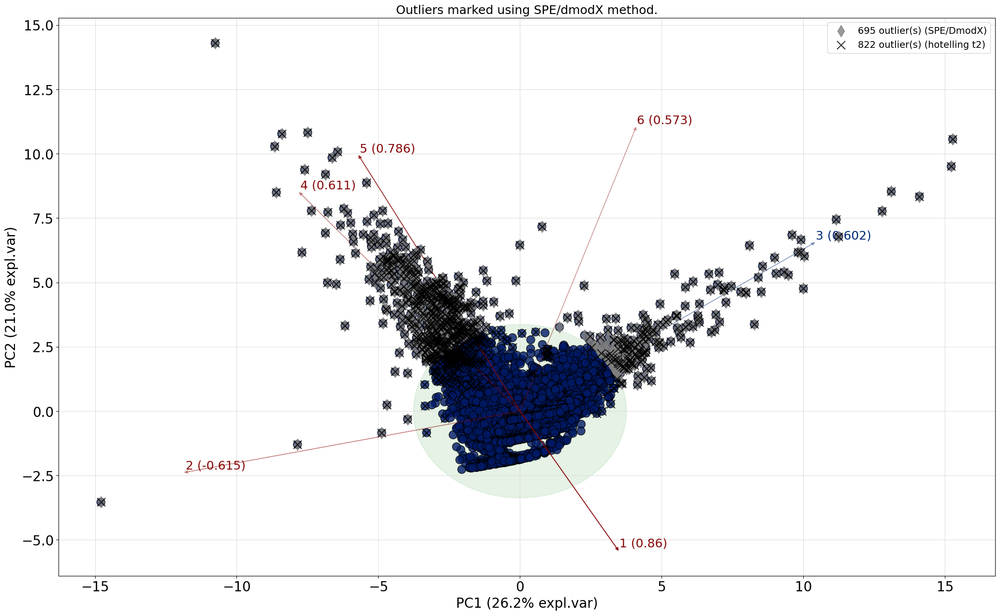

In [117]:
# Plot SPE/DmodX method
model.biplot(SPE=True, HT2=True, title='Outliers marked using SPE/dmodX method.')

[datazets] >WARNING> No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3DSubplot:title={'center':'Outliers marked using SPE/dmodX method and Hotelling T2.'}, xlabel='PC1 (26.2% expl.var)', ylabel='PC2 (21.0% expl.var)'>)

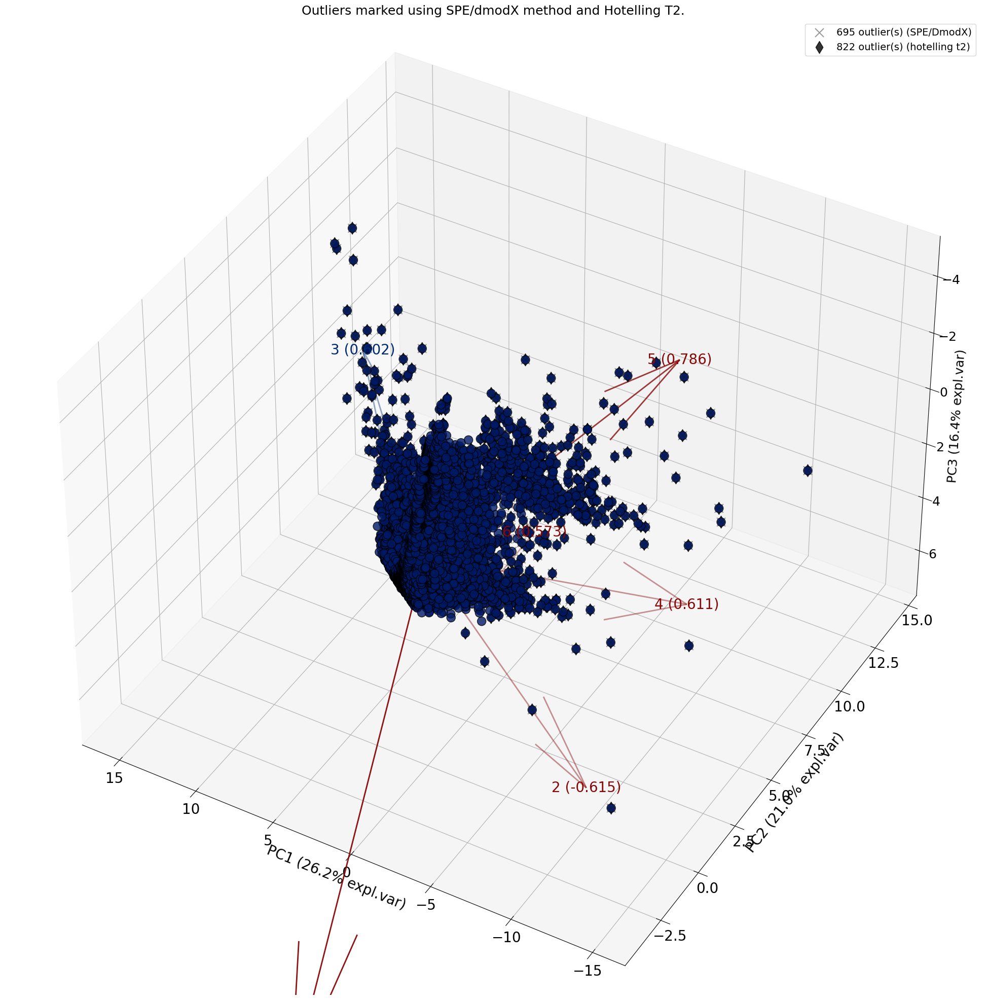

In [118]:
# Make a plot in 3 dimensions
model.biplot3d(SPE=True, HT2=True, arrowdict={'scale_factor': 2.5, 'fontsize': 20}, title='Outliers marked using SPE/dmodX method and Hotelling T2.')

In [119]:
# Grab overlapping outliers
I_overlap = np.logical_and(results['outliers']['y_bool'], results['outliers']['y_bool_spe'])

In [120]:
total_df_cp.loc[I_overlap, :]

,release_year,runtime,seasons,score_actors,score_directors,age_certification_NC-17,age_certification_PG,age_certification_PG-13,age_certification_R,age_certification_TV-14,...,Country_ZA,Country_ZW,streaming_platform_HBO,streaming_platform_amazon,streaming_platform_apple,streaming_platform_disney,streaming_platform_netflix,streaming_platform_paramount,sentiment,imdb_binned_score
34,1989.0,24.0,9.0,0.250000,0.0,False,False,False,False,False,...,False,False,False,False,False,False,True,False,True,3
44,1986.0,161.0,0.0,1.000000,1.0,False,True,False,False,False,...,False,False,False,False,False,False,True,False,True,2
45,1989.0,124.0,0.0,1.083333,1.0,False,False,True,False,False,...,False,False,False,False,False,False,True,False,False,2
46,1984.0,10.0,24.0,0.000000,0.0,False,False,False,False,False,...,False,False,False,True,False,False,True,False,True,2
50,1987.0,10.0,13.0,0.000000,0.0,False,False,False,False,False,...,False,False,False,True,False,False,True,False,True,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21250,2022.0,103.0,0.0,1.416667,1.0,False,False,True,False,False,...,False,False,True,False,False,False,False,False,True,2
21262,2021.0,196.0,0.0,4.000000,0.0,False,False,False,True,False,...,False,False,True,False,False,False,False,False,True,2
21307,2022.0,102.0,0.0,0.000000,1.0,False,False,True,False,False,...,False,False,True,False,False,False,False,False,True,2
21312,2021.0,104.0,0.0,2.916667,0.0,False,False,False,False,False,...,False,False,True,False,False,False,False,False,True,2


In [121]:
total_df_cp = total_df_cp.drop(index=total_df_cp.index[I_overlap])

In [122]:
total_df_cp.reset_index(inplace=True)
total_df_cp.drop('index', axis=1, inplace=True)

In [123]:
total_df_cp.shape

(20853, 196)

In [124]:
X = total_df_cp.drop('imdb_binned_score', axis=1)
y = total_df_cp['imdb_binned_score']

In [125]:
# import pandas as pd
# from scipy import stats
# import matplotlib.pyplot as plt

# # Assuming you have already executed the code for outlier identification and have the outlier_indices

# # Create a DataFrame with the feature values and the outlier indicator
# df = pd.DataFrame(X_std1, columns=df_cat.columns)  # Replace X with your feature data
# df['Outlier'] = False
# df.loc[outlier_indices, 'Outlier'] = True

# # Separate the data into outlier and non-outlier groups
# outliers = df[df['Outlier']]
# non_outliers = df[~df['Outlier']]

# # Iterate over the features and compare their distributions
# for feature in df_cat.columns:  # Replace X.columns with your actual feature column names
#     outlier_values = outliers[feature]
#     non_outlier_values = non_outliers[feature]

#     # Compute summary statistics
#     outlier_mean = outlier_values.mean()
#     outlier_median = outlier_values.median()
#     outlier_std = outlier_values.std()

#     non_outlier_mean = non_outlier_values.mean()
#     non_outlier_median = non_outlier_values.median()
#     non_outlier_std = non_outlier_values.std()

#     # Visualize the distributions
#     plt.figure(figsize=(10, 6))
#     plt.hist(non_outlier_values, bins=30, alpha=0.5, label='Non-Outliers')
#     plt.hist(outlier_values, bins=30, alpha=0.5, label='Outliers')
#     plt.xlabel(feature)
#     plt.ylabel('Frequency')
#     plt.legend()
#     plt.show()

#     # Perform statistical tests
#     t_stat, p_value = stats.ttest_ind(outlier_values, non_outlier_values, equal_var=False)
#     print("Feature:", feature)
#     print("Outliers - Mean:", outlier_mean, "Median:", outlier_median, "Std:", outlier_std)
#     print("Non-Outliers - Mean:", non_outlier_mean, "Median:", non_outlier_median, "Std:", non_outlier_std)
#     print("Statistical Test - t-statistic:", t_stat, "p-value:", p_value)
#     print("----------------------------------")


### Handling class imbalance

In [126]:
category_counts = y.value_counts()

In [127]:
category_counts

2    11850
1     6761
3     1152
0     1090
Name: imdb_binned_score, dtype: int64

In [128]:
from imblearn.over_sampling import SMOTENC

In [129]:
import numpy as np
from imblearn.under_sampling import RandomUnderSampler

# undersampling

undersampled_category = 2

undersampler = RandomUnderSampler(sampling_strategy={undersampled_category: 6761})

X_resampled_under, y_resampled_under = undersampler.fit_resample(X, y)


In [130]:
# oversampling

categorical_features = [0, 3]
smotenc = SMOTENC(categorical_features=categorical_features)
X_resampled, y_resampled = smotenc.fit_resample(X_resampled_under, y_resampled_under)

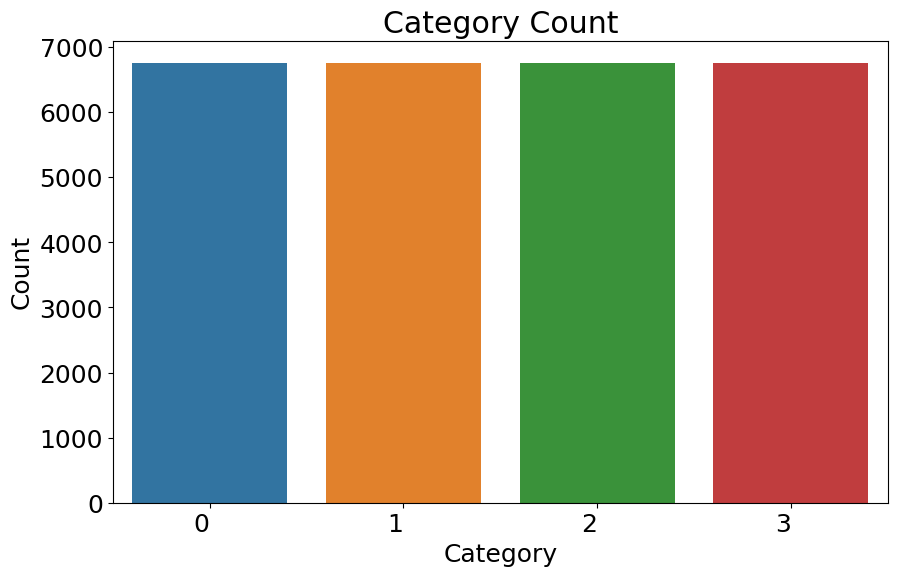

In [131]:
import seaborn as sns

category_counts = y_resampled.value_counts()
category_counts = category_counts.sort_index()

categories = category_counts.index.tolist()
counts = category_counts.tolist()

# Define a list of colors for each category
colors = ['blue', 'orange', 'green', 'red']  # Add more colors if you have more categories

plt.figure(figsize=(10, 6))

# Create a bar plot using seaborn
sns.barplot(x=categories, y=counts)

plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Category Count')

# Beautify the x-axis
plt.xticks(range(len(categories)), categories, ha='right')

plt.show()


## Starting ml models

All

In [132]:
total_df_cp = pd.concat([X_resampled, y_resampled], axis=1)

In [133]:
X = total_df_cp.drop('imdb_binned_score', axis=1)
y = total_df_cp['imdb_binned_score']

### PCA

Tried to do PCA but it didn't improve

In [134]:
# Standardize the data to have a mean of ~0 and a variance of 1
# X_std1 = StandardScaler().fit_transform(X)

In [135]:
# X.shape

In [136]:
# Create a PCA instance: pca
# pca1 = PCA()
# principalComponents1 = pca1.fit_transform(X_std1)

In [137]:
# Plot the explained variances
# plt.figure(figsize=(40, 20))
# features1 = range(pca1.n_components_)
# plt.bar(features1, pca1.explained_variance_ratio_, color='black')
# plt.xlabel('PCA features')
# plt.ylabel('variance %')
# plt.xticks(features1)
# # Save components to a DataFrame
# PCA_components1 = pd.DataFrame(principalComponents1)

In [138]:
# import numpy as np
# import matplotlib.pyplot as plt

# # Calculate the cumulative explained variance
# cumulative_variance = np.cumsum(pca1.explained_variance_ratio_)

# # Plot the cumulative explained variance
# plt.plot(range(1, len(cumulative_variance)+1), cumulative_variance, marker='o', linestyle='-')
# plt.xlabel('Number of Principal Components')
# plt.ylabel('Cumulative Explained Variance')
# plt.title('Cumulative Explained Variance vs. Number of PCs')
# plt.grid(True)

# # Find the elbow point (optimal number of PCs)
# elbow_point = np.argmax(cumulative_variance >= 0.95) + 1
# plt.axvline(x=elbow_point, color='r', linestyle='--')
# plt.text(elbow_point + 1, 0.95, f'{elbow_point} PCs', color='r')

# plt.show()


In [139]:
# X_ = PCA_components1.iloc[:, :2]

In [140]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [141]:
# from sklearn.ensemble import GradientBoostingRegressor
# gradboost = GradientBoostingRegressor(n_estimators = 1000)
# gradboost.fit(X_train, y_train)


In [142]:
# from sklearn.metrics import make_scorer, r2_score
# y_pred = gradboost.predict(X_test)
# print(r2_score(y_test, y_pred))

In [143]:
# from sklearn.metrics import make_scorer, accuracy_score
# scoring = make_scorer(accuracy_score)

In [144]:
# from sklearn.model_selection import GridSearchCV, KFold, train_test_split
# from sklearn.ensemble import GradientBoostingRegressor
# from sklearn.metrics import mean_squared_error
# import numpy as np


# # Split the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Define the parameter grid for GridSearchCV
# param_grid = {
#     'learning_rate': [0.1, 0.01, 0.001],
#     'n_estimators': [100, 200, 300],
#     'max_depth': [3, 4, 5]
# }

# # Create the GradientBoostingRegressor model
# gb_regressor = GradientBoostingRegressor()

# # Create the GridSearchCV object with k-fold cross-validation
# grid_search = GridSearchCV(estimator=gb_regressor, param_grid=param_grid, scoring=scoring)

# # Fit the GridSearchCV object to find the best model
# grid_search.fit(X_train, y_train)

# # Print the best parameter configuration
# print("Best Parameters: ", grid_search.best_params_)

# # Get the best model
# best_model = grid_search.best_estimator_

# # Evaluate the best model on the test set
# y_pred = best_model.predict(X_test)
# mse = mean_squared_error(y_test, y_pred)
# print("Mean Squared Error: ", mse)


In [145]:
# from sklearn.metrics import r2_score, mean_squared_error
# r2_score(y_test, y_pred)

---------------------

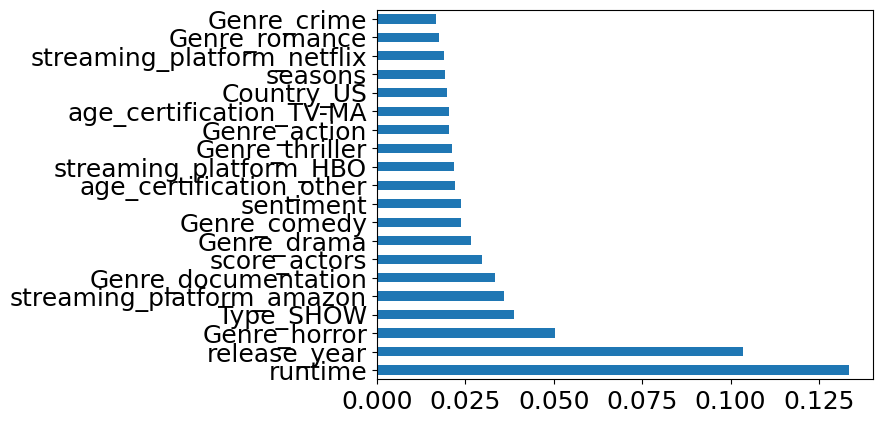

In [146]:
# tried to do feature selection
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X, y)
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')
plt.show()

In [317]:
top_threshold = len(feat_importances[feat_importances.lt(0.0001) == False]) #0.0008

In [318]:
# total_df_cp = total_df_cp.reset_index()
# total_df_cp.drop('index', axis=1, inplace=True)
# total_df_cp

In [319]:
new_total_df = total_df_cp[feat_importances.nlargest(top_threshold).index.to_list()]
new_total_df.shape

(27044, 114)

In [320]:
X = new_total_df
y = total_df_cp['imdb_binned_score']

### 10-fold cross validation

In [321]:
from sklearn.model_selection import StratifiedKFold, KFold

cv_kf = KFold(n_splits=6, shuffle=True, random_state=10)
split_list = []
i = 0
for train, test in cv_kf.split(X, y):
    print("Fold",i)
    print("Train:",train)
    print("Test:",test)
    i += 1
    # Split the train and test sets
    X_train, X_test = X.loc[train], X.loc[test]
    y_train, y_test = y.loc[train], y.loc[test]
    batch = [X_train, y_train, X_test, y_test]
    split_list.append(batch)

Fold 0
Train: [    0     1     2 ... 27040 27042 27043]
Test: [    5     7    16 ... 27023 27031 27041]
Fold 1
Train: [    1     2     3 ... 27038 27039 27041]
Test: [    0     9    13 ... 27040 27042 27043]
Fold 2
Train: [    0     1     2 ... 27041 27042 27043]
Test: [    3    34    44 ... 27036 27037 27038]
Fold 3
Train: [    0     1     2 ... 27041 27042 27043]
Test: [    8    12    21 ... 27024 27027 27028]
Fold 4
Train: [    0     2     3 ... 27041 27042 27043]
Test: [    1     4     6 ... 26988 26992 27039]
Fold 5
Train: [    0     1     3 ... 27041 27042 27043]
Test: [    2    11    18 ... 27017 27026 27032]


In [168]:
from sklearn.metrics import r2_score, mean_squared_error, confusion_matrix

In [169]:
def err(model, model_name, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    print('RMSE: {0:.3f}'.format(rmse))
    print('R2 Score: {0:.3f}'.format(r2))
    
    model_names.append(model_name)
    values['RMSE'].append(rmse)
    values['R2_Score'].append(r2)

In [170]:
from collections import defaultdict
values = defaultdict(list)
model_names = list()

In [171]:
from sklearn import metrics

In [172]:
from sklearn.metrics import classification_report, confusion_matrix

In [322]:
from sklearn.ensemble import RandomForestClassifier
avg_acc_rf = 0
for split in split_list:

    X_train = split[0]
    y_train = split[1]
    X_test = split[2]
    y_test = split[3]
    ranfor = RandomForestClassifier()
    ranfor.fit(X_train, y_train)
    y_pred = ranfor.predict(X_test)
    print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
    avg_acc_rf += metrics.accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    # Calculate sensitivity and specificity for each class
    num_classes = len(cm)
    sensitivity = []
    specificity = []

    for i in range(num_classes):
        tp = cm[i, i]
        fn = np.sum(cm[i, :]) - tp
        fp = np.sum(cm[:, i]) - tp
        tn = np.sum(cm) - tp - fn - fp

        sensitivity.append(tp / (tp + fn))
        specificity.append(tn / (tn + fp))

    # Print sensitivity and specificity for each class
    for i in range(num_classes):
        print(f"Class {i+1}: Sensitivity = {sensitivity[i]}, Specificity = {specificity[i]}")

avg_acc_rf /= 6

Accuracy: 0.7819432120674357
Class 1: Sensitivity = 0.8935185185185185, Specificity = 0.9632438739789965
Class 2: Sensitivity = 0.6633840644583706, Specificity = 0.879976408139192
Class 3: Sensitivity = 0.6382405745062837, Specificity = 0.8995285798467885
Class 4: Sensitivity = 0.9256474519632414, Specificity = 0.9670794321957112
Accuracy: 0.7797249334516415
Class 1: Sensitivity = 0.9059753954305799, Specificity = 0.9602373887240356
Class 2: Sensitivity = 0.6440071556350626, Specificity = 0.8843657817109144
Class 3: Sensitivity = 0.646797153024911, Specificity = 0.8995271867612293
Class 4: Sensitivity = 0.9193262411347518, Specificity = 0.9624260355029586
Accuracy: 0.7785666740625693
Class 1: Sensitivity = 0.9032846715328468, Specificity = 0.9610085019055995
Class 2: Sensitivity = 0.6377682403433477, Specificity = 0.8868940754039497
Class 3: Sensitivity = 0.6533687943262412, Specificity = 0.8916839301568511
Class 4: Sensitivity = 0.9293381037567084, Specificity = 0.9642962525818826
Acc

In [324]:
from xgboost import XGBClassifier
avg_acc_xgb = 0
for split in split_list:

    X_train = split[0]
    y_train = split[1]
    X_test = split[2]
    y_test = split[3]
    xgb = XGBClassifier()
    xgb.fit(X_train, y_train)
    y_pred = xgb.predict(X_test)
    print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
    avg_acc_xgb += metrics.accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    # Calculate sensitivity and specificity for each class
    num_classes = len(cm)
    sensitivity = []
    specificity = []

    for i in range(num_classes):
        tp = cm[i, i]
        fn = np.sum(cm[i, :]) - tp
        fp = np.sum(cm[:, i]) - tp
        tn = np.sum(cm) - tp - fn - fp

        sensitivity.append(tp / (tp + fn))
        specificity.append(tn / (tn + fp))

    # Print sensitivity and specificity for each class
    for i in range(num_classes):
        print(f"Class {i+1}: Sensitivity = {sensitivity[i]}, Specificity = {specificity[i]}")
avg_acc_xgb /= 6

Accuracy: 0.7710736468500443
Class 1: Sensitivity = 0.8722222222222222, Specificity = 0.9544924154025671
Class 2: Sensitivity = 0.6589077887197852, Specificity = 0.8841049837805957
Class 3: Sensitivity = 0.6732495511669659, Specificity = 0.8903948143783147
Class 4: Sensitivity = 0.8755221386800334, Specificity = 0.9664753850800363
Accuracy: 0.7666370896184561
Class 1: Sensitivity = 0.8734622144112478, Specificity = 0.9534124629080118
Class 2: Sensitivity = 0.6189624329159212, Specificity = 0.8902654867256637
Class 3: Sensitivity = 0.6850533807829181, Specificity = 0.8797281323877069
Class 4: Sensitivity = 0.8865248226950354, Specificity = 0.9656804733727811
Accuracy: 0.7630352784557355
Class 1: Sensitivity = 0.8877737226277372, Specificity = 0.9583699794781589
Class 2: Sensitivity = 0.6094420600858369, Specificity = 0.8895870736086176
Class 3: Sensitivity = 0.6817375886524822, Specificity = 0.8706717963894643
Class 4: Sensitivity = 0.8828264758497316, Specificity = 0.9645913248745943
A

In [325]:
import lightgbm as lgb
avg_acc_lgb = 0
for split in split_list:

    X_train = split[0]
    y_train = split[1]
    X_test = split[2]
    y_test = split[3]
    lgbm = lgb.LGBMClassifier(objective = 'classification', num_leaves = 5, n_estimators = 1000)
    lgbm.fit(X_train, y_train)
    y_pred = lgbm.predict(X_test)
    print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
    avg_acc_lgb += metrics.accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    # Calculate sensitivity and specificity for each class
    num_classes = len(cm)
    sensitivity = []
    specificity = []

    for i in range(num_classes):
        tp = cm[i, i]
        fn = np.sum(cm[i, :]) - tp
        fp = np.sum(cm[:, i]) - tp
        tn = np.sum(cm) - tp - fn - fp

        sensitivity.append(tp / (tp + fn))
        specificity.append(tn / (tn + fp))

    # Print sensitivity and specificity for each class
    for i in range(num_classes):
        print(f"Class {i+1}: Sensitivity = {sensitivity[i]}, Specificity = {specificity[i]}")
avg_acc_lgb /= 6

Accuracy: 0.7568766637089619
Class 1: Sensitivity = 0.8435185185185186, Specificity = 0.9471995332555426
Class 2: Sensitivity = 0.6598030438675022, Specificity = 0.8787968150987909
Class 3: Sensitivity = 0.6597845601436265, Specificity = 0.8895109015910431
Class 4: Sensitivity = 0.8596491228070176, Specificity = 0.961038961038961
Accuracy: 0.7579858030168589
Class 1: Sensitivity = 0.8550087873462214, Specificity = 0.9513353115727003
Class 2: Sensitivity = 0.6341681574239714, Specificity = 0.88023598820059
Class 3: Sensitivity = 0.6672597864768683, Specificity = 0.8815011820330969
Class 4: Sensitivity = 0.87322695035461, Specificity = 0.9644970414201184
Accuracy: 0.752607055691147
Class 1: Sensitivity = 0.8704379562043796, Specificity = 0.9507475813544415
Class 2: Sensitivity = 0.6206008583690987, Specificity = 0.8868940754039497
Class 3: Sensitivity = 0.6631205673758865, Specificity = 0.8730393607576206
Class 4: Sensitivity = 0.8649373881932021, Specificity = 0.95868987902036
Accuracy:

In [326]:
from sklearn.neighbors import KNeighborsClassifier
avg_acc_knn = 0
for split in split_list:

    X_train = split[0]
    y_train = split[1]
    X_test = split[2]
    y_test = split[3]
    knn = KNeighborsClassifier()
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
    avg_acc_knn += metrics.accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    # Calculate sensitivity and specificity for each class
    num_classes = len(cm)
    sensitivity = []
    specificity = []

    for i in range(num_classes):
        tp = cm[i, i]
        fn = np.sum(cm[i, :]) - tp
        fp = np.sum(cm[:, i]) - tp
        tn = np.sum(cm) - tp - fn - fp

        sensitivity.append(tp / (tp + fn))
        specificity.append(tn / (tn + fp))

    # Print sensitivity and specificity for each class
    for i in range(num_classes):
        print(f"Class {i+1}: Sensitivity = {sensitivity[i]}, Specificity = {specificity[i]}")
avg_acc_knn /= 6

C:\Users\li493\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



Accuracy: 0.7091836734693877
Class 1: Sensitivity = 0.9092592592592592, Specificity = 0.9005250875145857
Class 2: Sensitivity = 0.5658012533572068, Specificity = 0.8640519020937777
Class 3: Sensitivity = 0.4865350089766607, Specificity = 0.9080730701237478
Class 4: Sensitivity = 0.8696741854636592, Specificity = 0.9405013591060103


C:\Users\li493\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



Accuracy: 0.7076308784383318
Class 1: Sensitivity = 0.9121265377855887, Specificity = 0.9008902077151335
Class 2: Sensitivity = 0.5509838998211091, Specificity = 0.8666666666666667
Class 3: Sensitivity = 0.5026690391459074, Specificity = 0.8974586288416075
Class 4: Sensitivity = 0.8608156028368794, Specificity = 0.9452662721893491


C:\Users\li493\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



Accuracy: 0.7029065897492789
Class 1: Sensitivity = 0.9215328467153284, Specificity = 0.8965112870126063
Class 2: Sensitivity = 0.5467811158798284, Specificity = 0.8686415320167564
Class 3: Sensitivity = 0.49556737588652483, Specificity = 0.8967150044391832
Class 4: Sensitivity = 0.8604651162790697, Specificity = 0.9415756860430805


C:\Users\li493\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



Accuracy: 0.6922564899045929
Class 1: Sensitivity = 0.9012658227848102, Specificity = 0.8976520168573149
Class 2: Sensitivity = 0.5342342342342342, Specificity = 0.8536944362672947
Class 3: Sensitivity = 0.4801762114537445, Specificity = 0.8929418742586003
Class 4: Sensitivity = 0.8486536675951718, Specificity = 0.9448979591836735


C:\Users\li493\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



Accuracy: 0.7086753938318172
Class 1: Sensitivity = 0.9148550724637681, Specificity = 0.9124302086394358
Class 2: Sensitivity = 0.5577617328519856, Specificity = 0.8643718740806119
Class 3: Sensitivity = 0.4911816578483245, Specificity = 0.8974206937444411
Class 4: Sensitivity = 0.8690783807062877, Specificity = 0.9378362223550508
Accuracy: 0.6982471710672288
Class 1: Sensitivity = 0.9127806563039723, Specificity = 0.9041504926843834
Class 2: Sensitivity = 0.5389326334208224, Specificity = 0.8561236623067776
Class 3: Sensitivity = 0.4928952042628774, Specificity = 0.8935226264418811
Class 4: Sensitivity = 0.850925925925926, Specificity = 0.9430989203384885


C:\Users\li493\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



In [327]:
from sklearn.ensemble import GradientBoostingClassifier
avg_acc_gb = 0
for split in split_list:

    X_train = split[0]
    y_train = split[1]
    X_test = split[2]
    y_test = split[3]
    gb = GradientBoostingClassifier()
    gb.fit(X_train, y_train)
    y_pred = gb.predict(X_test)
    print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
    avg_acc_gb += metrics.accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    # Calculate sensitivity and specificity for each class
    num_classes = len(cm)
    sensitivity = []
    specificity = []

    for i in range(num_classes):
        tp = cm[i, i]
        fn = np.sum(cm[i, :]) - tp
        fp = np.sum(cm[:, i]) - tp
        tn = np.sum(cm) - tp - fn - fp

        sensitivity.append(tp / (tp + fn))
        specificity.append(tn / (tn + fp))

    # Print sensitivity and specificity for each class
    for i in range(num_classes):
        print(f"Class {i+1}: Sensitivity = {sensitivity[i]}, Specificity = {specificity[i]}")
avg_acc_gb /= 6

Accuracy: 0.6978704525288376
Class 1: Sensitivity = 0.762962962962963, Specificity = 0.92561260210035
Class 2: Sensitivity = 0.6007162041181737, Specificity = 0.8599233264523739
Class 3: Sensitivity = 0.5771992818671454, Specificity = 0.8924572775486153
Class 4: Sensitivity = 0.8421052631578947, Specificity = 0.9193597100573845
Accuracy: 0.7014196983141082
Class 1: Sensitivity = 0.781195079086116, Specificity = 0.9382789317507418
Class 2: Sensitivity = 0.5966010733452594, Specificity = 0.8631268436578171
Class 3: Sensitivity = 0.5854092526690391, Specificity = 0.8797281323877069
Class 4: Sensitivity = 0.8404255319148937, Specificity = 0.9210059171597633
Accuracy: 0.7024628355890836
Class 1: Sensitivity = 0.7837591240875912, Specificity = 0.9328642626795661
Class 2: Sensitivity = 0.5811158798283261, Specificity = 0.86983842010772
Class 3: Sensitivity = 0.599290780141844, Specificity = 0.880437999408109
Class 4: Sensitivity = 0.853309481216458, Specificity = 0.919445264089702
Accuracy: 0

### Compare the results

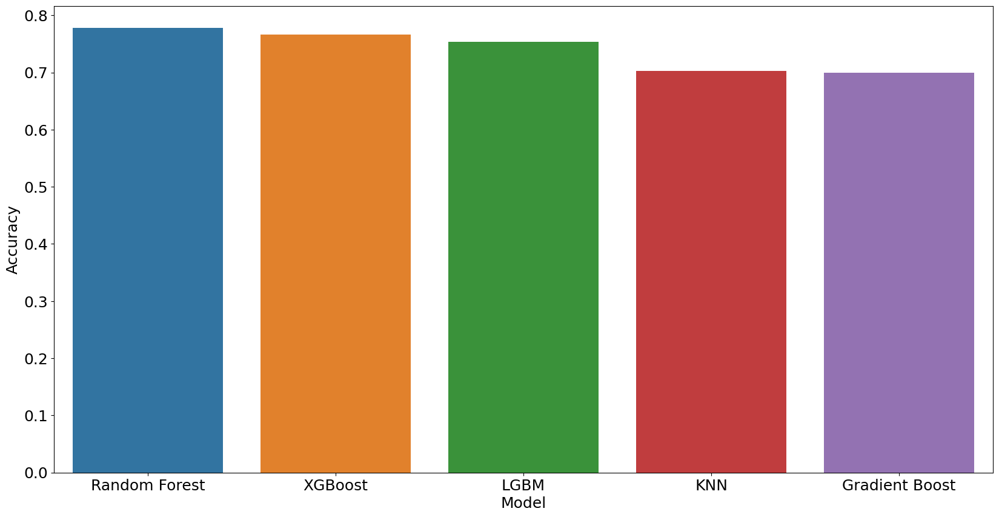

In [328]:
acc_dict = {"Accuracy": [avg_acc_rf, avg_acc_xgb, avg_acc_lgb, avg_acc_knn, avg_acc_gb],
            "Model": ["Random Forest", "XGBoost", "LGBM", "KNN", "Gradient Boost"]}
acc_dict = pd.DataFrame(acc_dict)
# visualize the target variable
plt.figure(figsize=(20, 10))
ax = sns.barplot(x="Model", y="Accuracy", data=acc_dict)
plt.show()